In [23]:
import pandas as pd
import numpy as np
import pickle

from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error
import seaborn as sns
import scipy.stats as st

# ALGORITMO DE PREDICCIÓN DE DESARROLLO DE DIABETES MELLITUS GESTACIONAL

<p>Vamos a usar le modelo que aparece en el estudio <a href= "https://www.techscience.com/csse/v40n1/44217"> "Ensemble classifier technique to predict gestational diabetes mellitus (gdm)"</a>, en el obtienen una precision del 96,87%.</p>

Un autoencoder en Keras es un tipo de red neuronal diseñado para aprender una representación comprimida de los datos, también conocida como codificación o embeddings. Su objetivo principal es reconstruir los datos de entrada en la salida, pasando por una capa intermedia de menor dimensionalidad.

<p>Funcionamiento del Autoencoder</p>

<ol>
    <li>Entrenamiento:Se entrena usando los mismos datos como entrada y salida, es decir, el objetivo es que el autoencoder aprenda a reconstruir las entradas originales.
    La pérdida suele ser el error cuadrático medio (MSE) entre la entrada original y la reconstrucción.</li>
    <li>Representaciones comprimidas:Una vez entrenado, puedes usar la parte del encoder para obtener representaciones comprimidas de los datos. Estas representaciones pueden ser útiles para tareas como clasificación, detección de anomalías o visualización.</li>
    <li>Reconstrucción:La parte completa del autoencoder (encoder + decoder) puede ser utilizada para reconstruir los datos de entrada.</li>
        
</ol>


In [8]:
data = pd.read_csv('Gestational-Diabetes-COMPLETE.csv')

In [134]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from keras.models import Model
from keras.layers import Input, Dense, Dropout
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.callbacks import EarlyStopping
# 1. Selección de las variables predictoras y objetivo
X = data[['Age', 'BMI', 'Sys BP', 'OGTT', 'HDL', 'Hemoglobin']]  # Variables predictoras seleccionadas
y = data['Class Label(GDM /Non GDM)']  # Variable objetivo: GDM / non-GDM

# Dividimos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 2. Construimos el autoencoder
input_dim = X_train.shape[1]  # Número de características
encoding_dim = 10  # Regla: dimensionalidad comprimida (puede ser ajustada)

# Modelo autoencoder:
input_layer = Input(shape=(input_dim, ))
encoded = Dense(32, activation='relu', kernel_regularizer = l2(0.001))(input_layer)  # Primera capa oculta
#encoded = Dense(encoding_dim, activation='relu')(encoded)  # Capa comprimida
encoded =Dropout(0.2)(encoded)
encoded = Dense(encoding_dim, activation='relu')(encoded)

decoded = Dense(32, activation='relu')(encoded)  # Reconstrucción
decoded = Dense(input_dim, activation='sigmoid')(decoded)

# Autoencoder completo
autoencoder = Model(inputs=input_layer, outputs=decoded)
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# 3. Entrenamos el autoencoder
history = autoencoder.fit(
    X_train, X_train,  # El autoencoder trata de reconstruir las mismas entradas
    epochs=200,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

# 4. Extraer las características comprimidas del autoencoder
encoder = Model(inputs=input_layer, outputs=encoded)  # Modelo para codificar
X_train_encoded = encoder.predict(X_train)  # Características comprimidas del conjunto de entrenamiento
X_test_encoded = encoder.predict(X_test)  # Características comprimidas del conjunto de prueba

# 5. Entrenar el clasificador usando las características comprimidas
classifier = RandomForestClassifier(random_state=42)
classifier.fit(X_train_encoded, y_train)

# Predicción y evaluación del modelo
y_pred = classifier.predict(X_test_encoded)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Epoch 1/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8999.5752 - val_loss: 9175.6680
Epoch 2/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8900.6084 - val_loss: 9175.6660
Epoch 3/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9038.9980 - val_loss: 9175.6650
Epoch 4/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8872.4014 - val_loss: 9175.6650
Epoch 5/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9021.8584 - val_loss: 9175.6650
Epoch 6/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9069.2686 - val_loss: 9175.6641
Epoch 7/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8834.7109 - val_loss: 9175.6641
Epoch 8/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8968.7568 - val_loss: 9175.6641
Epoch 9/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9043.0684 - val_loss: 9175.6641
Epoch 10/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9094.2520 - val_loss: 9175.6641
Epoch 11/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8915.4053 - val_loss: 9175.66

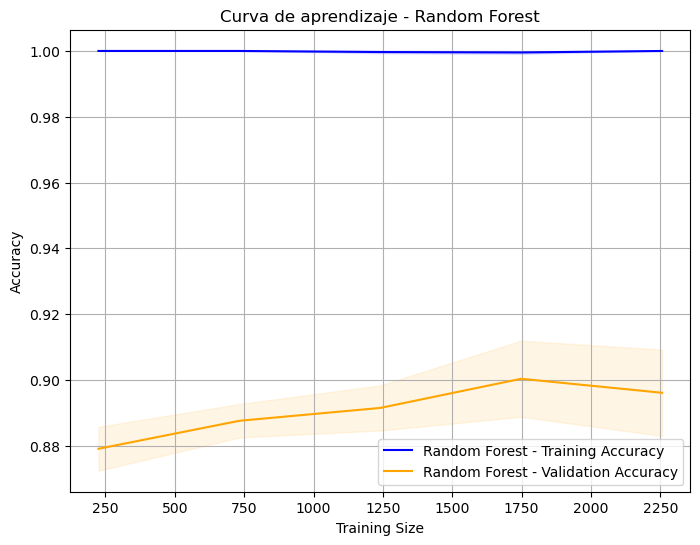

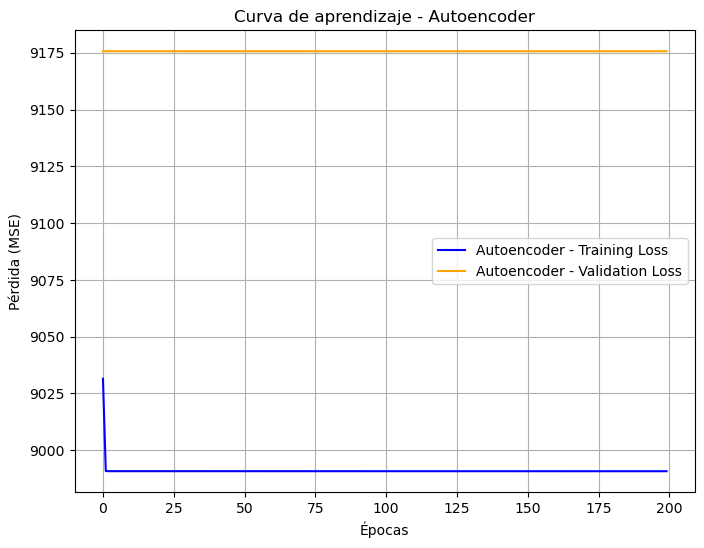

In [136]:
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
import numpy as np

# Learning curve para Random Forest Classifier
train_sizes_rf, train_scores_rf, test_scores_rf = learning_curve(
    classifier, X_train_encoded, y_train, cv=5, scoring='accuracy', n_jobs=-1)

# Calcular medias y desviaciones estándar para Random Forest
train_mean_rf = np.mean(train_scores_rf, axis=1)
test_mean_rf = np.mean(test_scores_rf, axis=1)
train_std_rf = np.std(train_scores_rf, axis=1)
test_std_rf = np.std(test_scores_rf, axis=1)

# Graficar la curva de aprendizaje para Random Forest
plt.figure(figsize=(8, 6))
plt.plot(train_sizes_rf, train_mean_rf, label="Random Forest - Training Accuracy", color="blue")
plt.plot(train_sizes_rf, test_mean_rf, label="Random Forest - Validation Accuracy", color="orange")
plt.fill_between(train_sizes_rf, train_mean_rf - train_std_rf, train_mean_rf + train_std_rf, alpha=0.1, color="blue")
plt.fill_between(train_sizes_rf, test_mean_rf - test_std_rf, test_mean_rf + test_std_rf, alpha=0.1, color="orange")
plt.title("Curva de aprendizaje - Random Forest")
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

# Learning curve para el autoencoder (usando pérdida como métrica)
plt.figure(figsize=(8, 6))
plt.plot(history.history['loss'], label='Autoencoder - Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Autoencoder - Validation Loss', color='orange')
plt.title('Curva de aprendizaje - Autoencoder')
plt.xlabel('Épocas')
plt.ylabel('Pérdida (MSE)')
plt.legend()
plt.grid()
plt.show()

El modelo esta overfitted como se puede comprobar

## BÚSQUEDA DE PARÁMETROS PARA MEJORAR LA PRECISIÓN DE LOS MODELOS

Mejores parámetros para Random Forest:
{'bootstrap': False, 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}
Accuracy en el conjunto de prueba (Random Forest): 0.8992907801418439

In [337]:
from sklearn.metrics import accuracy_score, classification_report

# Predicciones en el conjunto de entrenamiento
y_train_pred = best_rf_model.predict(X_train_encoded)

# Predicciones en el conjunto de prueba
y_test_pred = best_rf_model.predict(X_test_encoded)

# Calcular precisión
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print(f"Precisión en entrenamiento: {train_accuracy:.2f}")
print(f"Precisión en prueba: {test_accuracy:.2f}")

# Reporte de clasificación para el conjunto de prueba
print("\nReporte de clasificación en prueba:")
print(classification_report(y_test, y_test_pred))


Precisión en entrenamiento: 0.99
Precisión en prueba: 0.90

Reporte de clasificación en prueba:
              precision    recall  f1-score   support

           0       0.95      0.89      0.92       448
           1       0.83      0.92      0.87       257

    accuracy                           0.90       705
   macro avg       0.89      0.90      0.89       705
weighted avg       0.90      0.90      0.90       705



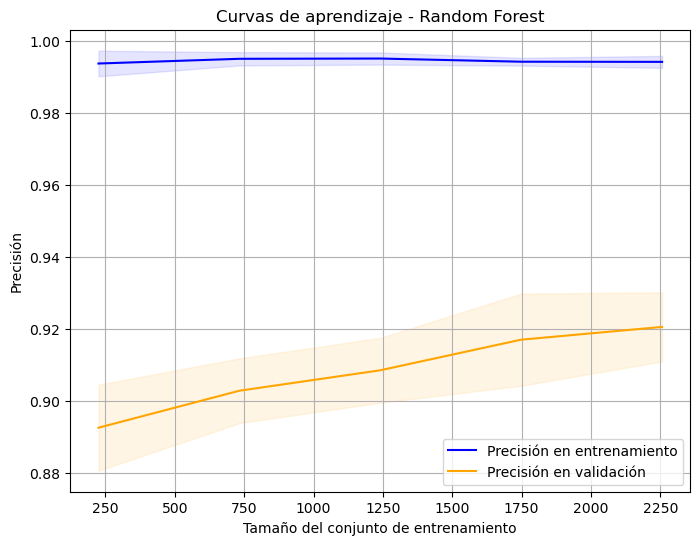

In [339]:
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

# Generar las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    best_rf_model, X_train_encoded, y_train, cv=5, scoring='accuracy', n_jobs=-1)

# Calcular medias y desviaciones estándar
train_mean = train_scores.mean(axis=1)
test_mean = test_scores.mean(axis=1)
train_std = train_scores.std(axis=1)
test_std = test_scores.std(axis=1)

# Graficar las curvas de aprendizaje
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_mean, label="Precisión en entrenamiento", color="blue")
plt.plot(train_sizes, test_mean, label="Precisión en validación", color="orange")
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color="blue")
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color="orange")
plt.title("Curvas de aprendizaje - Random Forest")
plt.xlabel("Tamaño del conjunto de entrenamiento")
plt.ylabel("Precisión")
plt.legend()
plt.grid()
plt.show()


Hacemos lo mismo para el autoencoder: 

In [271]:
import numpy as np
from keras.models import Model
from keras.layers import Input, Dense
from scikeras.wrappers import KerasRegressor
from sklearn.model_selection import GridSearchCV

# Crear el autoencoder como función para KerasRegressor
def create_autoencoder(encoding_dim=4, hidden_dim=16, activation='relu', optimizer='adam'):
    input_dim = X_train.shape[1]  # Número de características de entrada

    # Construcción del autoencoder
    input_layer = Input(shape=(input_dim,))
    encoded = Dense(hidden_dim, activation=activation)(input_layer)
    encoded = Dense(encoding_dim, activation=activation)(encoded)  # Capa comprimida
    decoded = Dense(hidden_dim, activation=activation)(encoded)
    decoded = Dense(input_dim, activation='sigmoid')(decoded)

    # Modelo completo del autoencoder
    autoencoder = Model(inputs=input_layer, outputs=decoded)
    autoencoder.compile(optimizer=optimizer, loss='mse')  # Usar MSE como pérdida
    return autoencoder

# Envuelve el modelo para usarlo con GridSearchCV
autoencoder_regressor = KerasRegressor(build_fn=create_autoencoder, verbose=0)

# Definir el espacio de búsqueda de hiperparámetros
param_grid = {
    'model__encoding_dim': [2, 4, 8],
    'model__hidden_dim': [8, 16, 32],
    'model__activation': ['relu', 'tanh'],
    'model__optimizer': ['adam', 'sgd'],
    'batch_size': [16, 32],
    'epochs': [50, 100]
}

# Configurar GridSearchCV
grid_search = GridSearchCV(
    estimator=autoencoder_regressor,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',  # Minimizar el error cuadrático medio
    cv=3,  # Validación cruzada de 3 pliegues
    verbose=2,
    n_jobs=-1
)

# Ajustar el GridSearchCV
grid_search.fit(X_train, X_train)  # Entradas y salidas son las mismas en un autoencoder

# Mejor modelo encontrado
best_autoencoder = grid_search.best_estimator_
best_params = grid_search.best_params_

print("Mejores parámetros para el autoencoder:")
print(best_params)

Fitting 3 folds for each of 144 candidates, totalling 432 fits


C:\Users\virginia.anton\anaconda3\Lib\site-packages\joblib\externals\loky\process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
C:\Users\virginia.anton\anaconda3\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,
C:\Users\virginia.anton\anaconda3\Lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Mejores parámetros para el autoencoder:
{'batch_size': 16, 'epochs': 50, 'model__activation': 'relu', 'model__encoding_dim': 2, 'model__hidden_dim': 32, 'model__optimizer': 'sgd'}


In [296]:
from keras.models import Model

# Reconstruir el modelo con los mejores parámetros
best_params = grid_search.best_params_
print("Mejores parámetros:", best_params)

# Crear el modelo del autoencoder
autoencoder = create_autoencoder(
    encoding_dim=4,
    hidden_dim=best_params['model__hidden_dim'],
    activation=best_params['model__activation'],
    optimizer=best_params['model__optimizer']
)

# Entrenar el modelo con los mejores parámetros
autoencoder.fit(
    X_train, X_train,
    epochs=best_params['epochs'],
    batch_size=best_params['batch_size'],
    verbose=1
)

# Guardar el modelo completo del autoencoder
autoencoder.save("best_autoencoder_model.keras")
print("Modelo del autoencoder completo guardado como 'best_autoencoder_model.keras'.")

# Extraer el encoder
input_layer = autoencoder.input
encoded_layer = autoencoder.layers[2].output  # Capa comprimida
encoder = Model(inputs=input_layer, outputs=encoded_layer)

encoder.save("best_encoder_model.keras")
print("Modelo del encoder guardado como 'best_encoder_model.keras'.")

Mejores parámetros: {'batch_size': 16, 'epochs': 50, 'model__activation': 'relu', 'model__encoding_dim': 2, 'model__hidden_dim': 32, 'model__optimizer': 'sgd'}
Epoch 1/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 11800.0410
Epoch 2/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 11738.4932
Epoch 3/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 11688.5107
Epoch 4/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 11712.6143
Epoch 5/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 11595.9092
Epoch 6/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 11822.3154
Epoch 7/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 11821.1455
Epoch 8/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 11747.7637
Epoch 9/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 11701.6484  
Epoch 10/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 11627.7314
Epoch 11/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 11784.1104
Epoch 12/50
177/177 ━━━━━━━━━━━━━━━━━━━

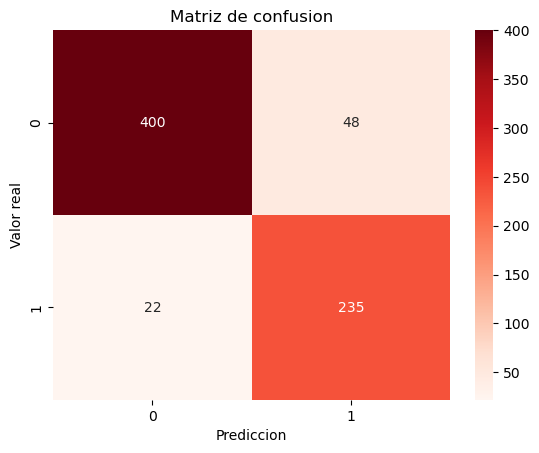

In [341]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt= 'd', cmap='Reds')
plt.xlabel('Prediccion')
plt.ylabel('Valor real')
plt.title('Matriz de confusion')
plt.show()

### ÚLTIMO INTENTO: CLASES BALANCEADAS Y MAYOR REGULARIZACIÓN EN LAS CAPAS DE ENTRADA

In [165]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from keras.models import Model
from keras.layers import Input, Dense, Dropout
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.callbacks import EarlyStopping
# 1. Selección de las variables predictoras y objetivo
X = data[['Age', 'BMI', 'Sys BP', 'Dia BP',  'OGTT', 'HDL', 'Hemoglobin']]  # Variables predictoras seleccionadas
y = data['Class Label(GDM /Non GDM)']  # Variable objetivo: GDM / non-GDM

# Dividimos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 2. Construimos el autoencoder
input_dim = X_train.shape[1]  # Número de características
encoding_dim = 10  # Regla: dimensionalidad comprimida (puede ser ajustada)

# Modelo autoencoder:
input_layer = Input(shape=(input_dim, ))
encoded = Dense(32, activation='relu', kernel_regularizer = l2(0.001))(input_layer)  # Primera capa oculta
#encoded = Dense(encoding_dim, activation='relu')(encoded)  # Capa comprimida
encoded =Dropout(0.2)(encoded)
encoded = Dense(encoding_dim, activation='relu')(encoded)

decoded = Dense(32, activation='relu')(encoded)  # Reconstrucción
decoded = Dense(input_dim, activation='sigmoid')(decoded)

# Autoencoder completo
autoencoder = Model(inputs=input_layer, outputs=decoded)
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# 3. Entrenamos el autoencoder
history = autoencoder.fit(
    X_train, X_train,  # El autoencoder trata de reconstruir las mismas entradas
    epochs=200,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

# 4. Extraer las características comprimidas del autoencoder
encoder = Model(inputs=input_layer, outputs=encoded)  # Modelo para codificar
X_train_encoded = encoder.predict(X_train)  # Características comprimidas del conjunto de entrenamiento
X_test_encoded = encoder.predict(X_test)  # Características comprimidas del conjunto de prueba

# 5. Entrenar el clasificador usando las características comprimidas
classifier = RandomForestClassifier(n_estimators=300, max_depth=None, min_samples_split=20, min_samples_leaf=10, max_features='sqrt', class_weight='balanced', random_state=42)
classifier.fit(X_train_encoded, y_train)

# Predicción y evaluación del modelo
y_pred = classifier.predict(X_test_encoded)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Epoch 1/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 8643.9570 - val_loss: 8887.9150
Epoch 2/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8747.0000 - val_loss: 8864.7119
Epoch 3/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8810.1123 - val_loss: 8815.3730
Epoch 4/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8648.9141 - val_loss: 8815.3721
Epoch 5/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8562.0049 - val_loss: 8815.3721
Epoch 6/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8595.0283 - val_loss: 8815.3721
Epoch 7/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8640.6650 - val_loss: 8815.3721
Epoch 8/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8791.4658 - val_loss: 8815.3721
Epoch 9/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8716.2275 - val_loss: 8815.3721
Epoch 10/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8718.1348 - val_loss: 8815.3721
Epoch 11/200
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8604.4971 - val_loss: 8815.37

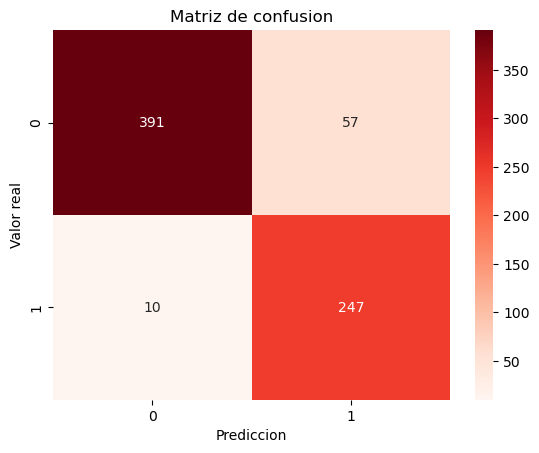

In [167]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt= 'd', cmap='Reds')
plt.xlabel('Prediccion')
plt.ylabel('Valor real')
plt.title('Matriz de confusion')
plt.show()

In [169]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(classifier, X_train_encoded, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean accuracy: {scores.mean()}")

Cross-validation scores: [0.91134752 0.92021277 0.93439716 0.92375887 0.90602837]
Mean accuracy: 0.9191489361702129


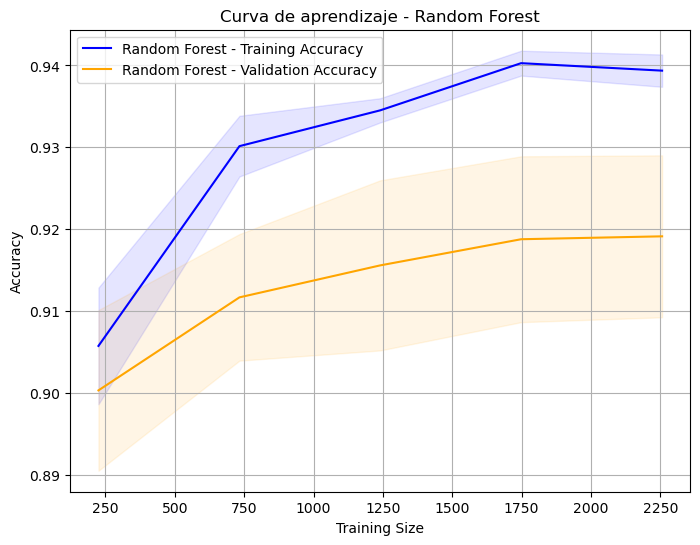

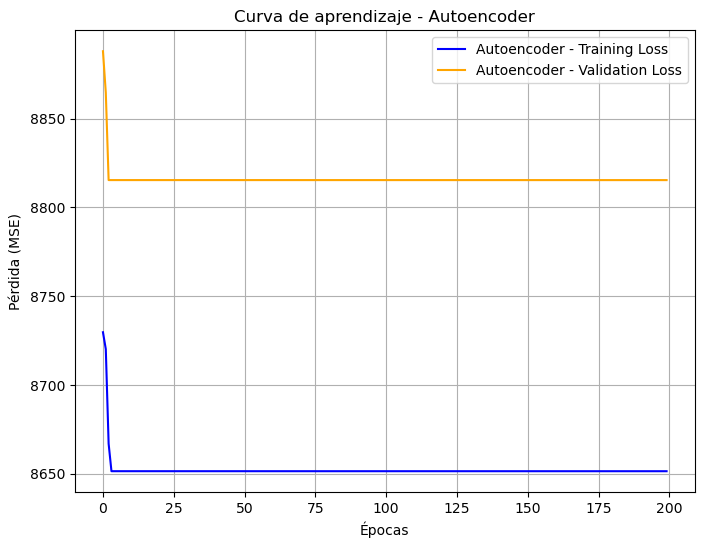

In [170]:
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
import numpy as np

# Learning curve para Random Forest Classifier
train_sizes_rf, train_scores_rf, test_scores_rf = learning_curve(
    classifier, X_train_encoded, y_train, cv=5, scoring='accuracy', n_jobs=-1)

# Calcular medias y desviaciones estándar para Random Forest
train_mean_rf = np.mean(train_scores_rf, axis=1)
test_mean_rf = np.mean(test_scores_rf, axis=1)
train_std_rf = np.std(train_scores_rf, axis=1)
test_std_rf = np.std(test_scores_rf, axis=1)

# Graficar la curva de aprendizaje para Random Forest
plt.figure(figsize=(8, 6))
plt.plot(train_sizes_rf, train_mean_rf, label="Random Forest - Training Accuracy", color="blue")
plt.plot(train_sizes_rf, test_mean_rf, label="Random Forest - Validation Accuracy", color="orange")
plt.fill_between(train_sizes_rf, train_mean_rf - train_std_rf, train_mean_rf + train_std_rf, alpha=0.1, color="blue")
plt.fill_between(train_sizes_rf, test_mean_rf - test_std_rf, test_mean_rf + test_std_rf, alpha=0.1, color="orange")
plt.title("Curva de aprendizaje - Random Forest")
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

# Learning curve para el autoencoder (usando pérdida como métrica)
plt.figure(figsize=(8, 6))
plt.plot(history.history['loss'], label='Autoencoder - Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Autoencoder - Validation Loss', color='orange')
plt.title('Curva de aprendizaje - Autoencoder')
plt.xlabel('Épocas')
plt.ylabel('Pérdida (MSE)')
plt.legend()
plt.grid()
plt.show()

En este punto, aceptamos el rendimiento del modelo, ya que la precisión es estable, lo que nos dice que el modelo está generalizando bien. 

Hemos reducido significativamente el overfitting, la diferencia entre entrenamiento y validación es pequeña. 

No hay necesidad de seguir ajustando hiperparámetros si el modelo ya cumple con los objetivos de la precisión y generalización, así lo consideramos un buen punto de parada. 

## SALVANDO EL MODELO Y AUTOENCODER ENTRENADOS

In [153]:
# Guardar el autoencoder completo
autoencoder.save("autoencoder_model.keras")

# Guardar solo el encoder (para extraer características)
encoder.save("encoder_model.keras")



In [27]:
from keras.models import load_model

# Cargar autoencoder
autoencoder = load_model("autoencoder_model.keras")

# Cargar encoder
encoder = load_model("encoder_model.keras")


In [31]:
# Cargar el modelo Random Forest
classifier = joblib.load("random_forest_model.pkl")

# PRUEBA DATOS WEARABLE (de gretel.ai con extensión de trimestres)

In [9]:
encounterData = pd.read_csv("encounter-simulation-with-common-users.csv")

In [7]:
wearabledf = pd.read_csv("wearable-simulation-with-common-users.csv")

In [12]:
encounterData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8254 entries, 0 to 8253
Data columns (total 28 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Unnamed: 0                                          8254 non-null   int64  
 1   user_id                                             8254 non-null   object 
 2   UNITS                                               8254 non-null   object 
 3   DATE                                                8254 non-null   object 
 4   BIRTHDATE                                           8254 non-null   object 
 5   GENDER                                              8254 non-null   object 
 6   RACE                                                8254 non-null   object 
 7   ETHNICITY                                           8254 non-null   object 
 8   Age                                                 8254 non-null   int64  
 9

In [14]:
wearabledf.head()

,user_id,Age,timestamp,DiastolicBP,SystolicBP,BS,BodyTemp,HeartRate,day,month&year,date,week,trimester
0,user_0000,32,2024-06-16 02:45:05,89.0,134.0,8.26,98.696800,100.0,2024-06-16,2024-06,2024-06-16,3,First
1,user_0000,32,2024-06-16 10:45:05,87.0,130.0,8.33,98.711909,108.0,2024-06-16,2024-06,2024-06-16,3,First
2,user_0000,32,2024-06-16 18:45:05,87.0,130.0,8.33,98.711909,108.0,2024-06-16,2024-06,2024-06-16,3,First
3,user_0000,31,2024-06-18 07:37:54,87.0,133.0,8.86,98.843603,121.0,2024-06-18,2024-06,2024-06-18,3,First
4,user_0000,31,2024-06-18 15:37:54,86.0,131.0,7.99,98.870108,102.0,2024-06-18,2024-06,2024-06-18,3,First


Quitamos las columnas que no nos interesan y cambiamos el nombre de las columnas a las mismas con las que se han entrenado al modelo

In [17]:
cols_to_drop = ['month&year', 'date']
wearabledf = wearabledf.drop(cols_to_drop, axis=1)

In [19]:
wearabledf.head()

,user_id,Age,timestamp,DiastolicBP,SystolicBP,BS,BodyTemp,HeartRate,day,week,trimester
0,user_0000,32,2024-06-16 02:45:05,89.0,134.0,8.26,98.696800,100.0,2024-06-16,3,First
1,user_0000,32,2024-06-16 10:45:05,87.0,130.0,8.33,98.711909,108.0,2024-06-16,3,First
2,user_0000,32,2024-06-16 18:45:05,87.0,130.0,8.33,98.711909,108.0,2024-06-16,3,First
3,user_0000,31,2024-06-18 07:37:54,87.0,133.0,8.86,98.843603,121.0,2024-06-18,3,First
4,user_0000,31,2024-06-18 15:37:54,86.0,131.0,7.99,98.870108,102.0,2024-06-18,3,First


Convertimos la escala de BS que está en mmol/L a mg/dl, ya que el modelo ha siod entrenado con esa escala. Para hacer el factor de conversión basta con multiplicar cada fila por 18 para tener el valor en mg/dl. 

In [22]:
wearabledf['BS'] = wearabledf['BS'] *18

In [24]:
#comprobamos resultado
wearabledf['BS'].describe()

count    4026.000000
mean      124.292072
std        31.646826
min        60.750000
25%       100.350000
50%       109.815944
75%       149.760000
max       234.000000
Name: BS, dtype: float64

Podemos observar que ha cambiado la escala

Ahora renombramos las columnas para que coincidan con el nombre con el que el algoritmo a aprendido a clasificar los datos. 
Cambios: 
<ul>
    <li>BS: se cambia por OGTT.</li>
    <li>SystolicBP : se cambia por Sys BP.</li>
    <li>DiastolicBP: se cambia por Dia BP.</li>
    <li>Añadimos la columna BMI del dataset de EncounterData.</li>
</ul>

In [28]:
#incluimos los datos del bmi para cada usuario en el dataset del wearable

bmi_mapping = encounterData.set_index('wearable_user_id')['Body mass index (BMI) [Ratio]'].to_dict()

#asignamos el BMI al dataset del wearable usuando wearable_df_user_id
wearabledf['BMI'] = wearabledf['user_id'].map(bmi_mapping)

#Verificar resultados
wearabledf[['user_id', 'BMI']].head(10)

,user_id,BMI
0,user_0000,29.1
1,user_0000,29.1
2,user_0000,29.1
3,user_0000,29.1
4,user_0000,29.1
5,user_0000,29.1
6,user_0000,29.1
7,user_0000,29.1
8,user_0000,29.1
9,user_0000,29.1


In [30]:
#Renombramos columnas
column_rename_mapping = {
    'BS': 'OGTT',
    'SystolicBP': 'Sys BP',
    'DiastolicBP': 'Dia BP'
}
wearabledf = wearabledf.rename(columns=column_rename_mapping)
print(wearabledf.columns)

Index(['user_id', 'Age', 'timestamp', 'Dia BP', 'Sys BP', 'OGTT', 'BodyTemp',
       'HeartRate', 'day', 'week', 'trimester', 'BMI'],
      dtype='object')


In [32]:
wearabledf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4026 entries, 0 to 4025
Data columns (total 12 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   user_id    4026 non-null   object 
 1   Age        4026 non-null   int64  
 2   timestamp  4026 non-null   object 
 3   Dia BP     4026 non-null   float64
 4   Sys BP     4026 non-null   float64
 5   OGTT       4026 non-null   float64
 6   BodyTemp   4026 non-null   float64
 7   HeartRate  4026 non-null   float64
 8   day        4026 non-null   object 
 9   week       4026 non-null   int64  
 10  trimester  4026 non-null   object 
 11  BMI        4026 non-null   float64
dtypes: float64(6), int64(2), object(4)
memory usage: 377.6+ KB


In [34]:
wearabledf = wearabledf[['Age', 'BMI', 'Sys BP', 'Dia BP', 'OGTT', 'user:']]


## TAREA DE CLASIFICACIÓN DE RIESGO DE DESARROLLO DE GDM PARA DATOS DEL WEARABLE CON LOS MEJORES PARÁMETROS

In [37]:
import joblib
from keras.models import load_model

# 1. Cargar los modelos guardados
# Cargar el Random Forest entrenado
classifier = joblib.load('best_rf_model.joblib')

# Cargar el encoder (parte del autoencoder para las características comprimidas)
encoder = load_model('encoder_model.h5')

In [39]:
from keras.models import load_model
from joblib import load

# 1. Cargar los modelos guardados
# Cargar el encoder para obtener representaciones comprimidas
encoder = load_model("encoder_model.h5")
print("Encoder cargado correctamente.")

# Cargar el modelo Random Forest previamente guardado
best_rf_model = load("best_rf_model.joblib")
print("Modelo Random Forest cargado correctamente.")

Encoder cargado correctamente.
Modelo Random Forest cargado correctamente.


In [41]:
# 3. Generar representaciones comprimidas con el encoder
compressed_wearable = encoder.predict(wearabledf)

# 4. Usar el modelo Random Forest para predecir con los datos comprimidos
predictions = best_rf_model.predict(compressed_wearable)
print("Predicciones realizadas con Random Forest.")

# 5. Mostrar las predicciones
print("Predicciones de clase para los datos nuevos:")
print(predictions)

126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Predicciones realizadas con Random Forest.
Predicciones de clase para los datos nuevos:
[0 0 0 ... 0 0 0]


In [43]:
# Crear un DataFrame con las predicciones
newpredictions_df = wearabledf.copy()  # Copia los datos originales
newpredictions_df['Predicted Target'] = predictions  # Agregar las predicciones

# Mostrar las primeras filas
print(newpredictions_df.head())


   Age   BMI  Sys BP  Dia BP    OGTT  Predicted Target
0   32  29.1   134.0    89.0  148.68                 0
1   32  29.1   130.0    87.0  149.94                 0
2   32  29.1   130.0    87.0  149.94                 0
3   31  29.1   133.0    87.0  159.48                 1
4   31  29.1   131.0    86.0  143.82                 0


Predicted Target
0    3816
1     210
Name: count, dtype: int64


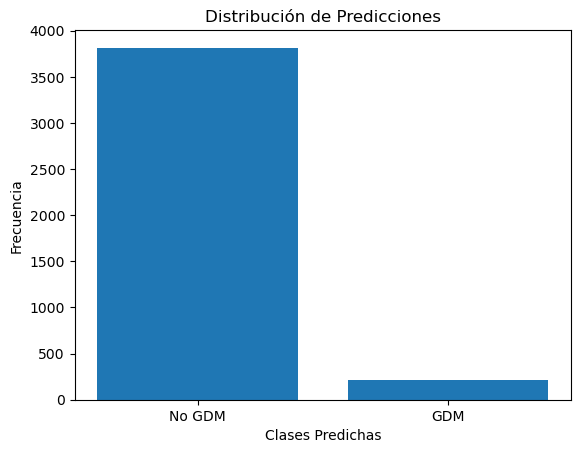

In [45]:
import matplotlib.pyplot as plt

# Conteo de predicciones
newpred_counts = newpredictions_df['Predicted Target'].value_counts()

# Gráfico de barras
plt.bar(newpred_counts.index, newpred_counts.values, tick_label=['No GDM', 'GDM'])
plt.title('Distribución de Predicciones')
plt.xlabel('Clases Predichas')
plt.ylabel('Frecuencia')
plt.show()

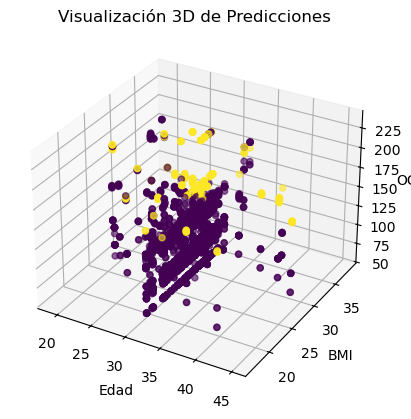

In [347]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Usar tres características principales para visualización
ax.scatter(newpredictions_df['Age'], newpredictions_df['BMI'], newpredictions_df['OGTT'],
           c=newpredictions_df['Predicted Target'], cmap='viridis', alpha=0.6)

ax.set_title('Visualización 3D de Predicciones')
ax.set_xlabel('Edad')
ax.set_ylabel('BMI')
ax.set_zlabel('OGTT')
plt.show()


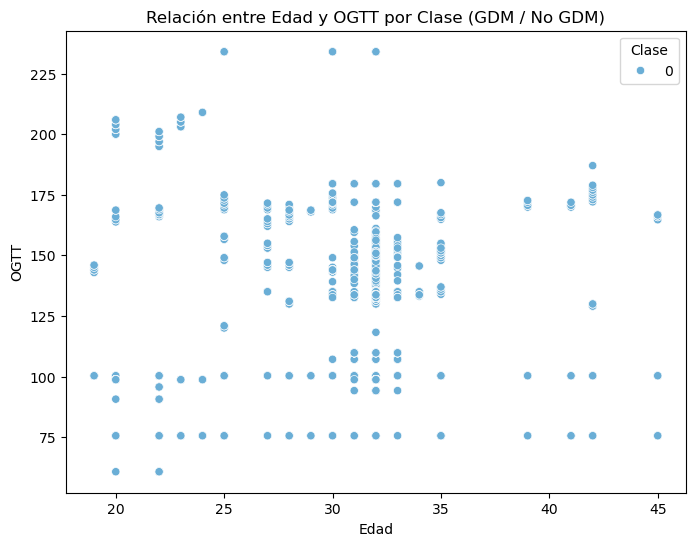

In [351]:
# Crear un gráfico de dispersión entre Edad y OGTT, coloreado por clase
plt.figure(figsize=(8, 6))
sns.scatterplot(x=newpredictions_df['Age'], y=newpredictions_df['OGTT'], hue=predictions_df['Predicted Target'], palette='Blues')
plt.title('Relación entre Edad y OGTT por Clase (GDM / No GDM)')
plt.xlabel('Edad')
plt.ylabel('OGTT')
plt.legend(title='Clase')
plt.show()

Como se puede ver, aunque se hayan encontrado losmejores parámetros, el sistema conjunto no funciona, de esta forma continuraemos con el primer modelo entrenado. 

------------------------------------------------------------------

## TAREA DE CLASIFICACIÓN DE RIESGO DE DESARROLLO DE GDM PARA DATOS DEL WEARABLE CON LOS PRIMEROS MODELOS ENTRENADOS

In [49]:
# 1. Extraer las características comprimidas del encoder
new_data_encoded = encoder.predict(wearabledf)

# 2. Usar el Random Forest para hacer predicciones
predictions = classifier.predict(new_data_encoded)

# 3. Mostrar las predicciones
print("Predicciones para los nuevos datos:")
print(predictions)  # Esto devolverá las clases predichas (e.g., 0 = no GDM, 1 = GDM)

126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step
Predicciones para los nuevos datos:
[0 0 0 ... 0 0 0]


In [51]:
# Crear un DataFrame con las predicciones
predictions_df = wearabledf.copy()  # Copia los datos originales
predictions_df['Predicted Target'] = predictions  # Agregar las predicciones

# Mostrar las primeras filas
print(predictions_df.head())


   Age   BMI  Sys BP  Dia BP    OGTT  Predicted Target
0   32  29.1   134.0    89.0  148.68                 0
1   32  29.1   130.0    87.0  149.94                 0
2   32  29.1   130.0    87.0  149.94                 0
3   31  29.1   133.0    87.0  159.48                 1
4   31  29.1   131.0    86.0  143.82                 0


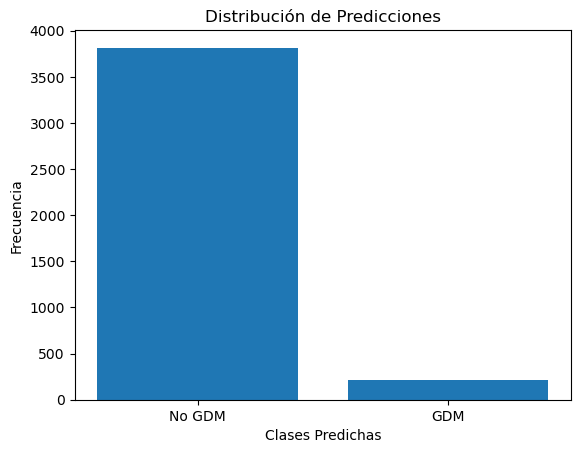

In [53]:
import matplotlib.pyplot as plt

# Conteo de predicciones
pred_counts = predictions_df['Predicted Target'].value_counts()

# Gráfico de barras
plt.bar(pred_counts.index, pred_counts.values, tick_label=['No GDM', 'GDM'])
plt.title('Distribución de Predicciones')
plt.xlabel('Clases Predichas')
plt.ylabel('Frecuencia')
plt.show()

In [55]:
predictions_df.to_csv('wearable-gdm-predictions.csv',index=False)

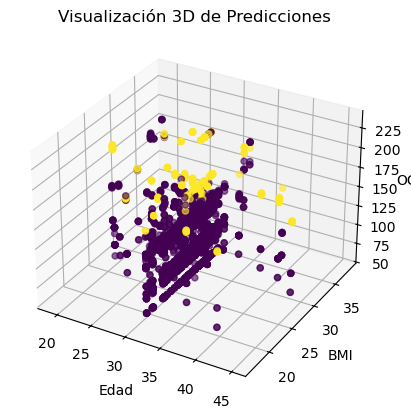

In [405]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Usar tres características principales para visualización
ax.scatter(predictions_df['Age'], predictions_df['BMI'], predictions_df['OGTT'],
           c=predictions_df['Predicted Target'], cmap='viridis', alpha=0.6)

ax.set_title('Visualización 3D de Predicciones')
ax.set_xlabel('Edad')
ax.set_ylabel('BMI')
ax.set_zlabel('OGTT')
plt.show()


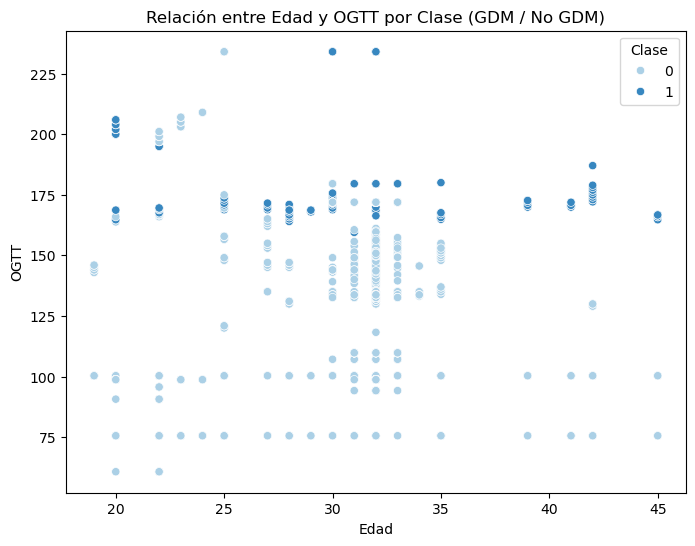

In [407]:
# Crear un gráfico de dispersión entre Edad y OGTT, coloreado por clase
plt.figure(figsize=(8, 6))
sns.scatterplot(x=predictions_df['Age'], y=predictions_df['OGTT'], hue=predictions_df['Predicted Target'], palette='Blues')
plt.title('Relación entre Edad y OGTT por Clase (GDM / No GDM)')
plt.xlabel('Edad')
plt.ylabel('OGTT')
plt.legend(title='Clase')
plt.show()

In [409]:
from scipy.stats import mannwhitneyu

# Dividir las edades por clase
age_no_gdm = predictions_df[predictions_df['Predicted Target'] == 0]['Age']
age_gdm = predictions_df[predictions_df['Predicted Target'] == 1]['Age']

# Prueba de Mann-Whitney U (prueba no paramétrica)
stat, p = mannwhitneyu(age_no_gdm, age_gdm)
print(f"Estadístico U: {stat}, p-valor: {p}")

if p < 0.05:
    print("La diferencia en las edades entre las clases es estadísticamente significativa.")
else:
    print("No hay diferencia estadísticamente significativa en las edades entre las clases.")

Estadístico U: 481924.0, p-valor: 1.3522515760695306e-07
La diferencia en las edades entre las clases es estadísticamente significativa.


En el gráfico no queda claro que la edad sea determinante para que el nivel de glucosa en sangre suba y por tanto haya más riesgo de padecer GDM. En cambio, las edades promedio de las personas con y sin GDM verifican que hay una diferencia significativa en la edad media de ambos grupos, dado a que el p-value es un valor muy pequeño. Sin embargo, esta métrica también cata diferencias sutiles, qie incluso podría ser irrelevante en términos prácticos 

Esto nos lleva a pensar que: 
<ol>
    <li>El wearable no es capaz de capturar de forma precisa los niveles de glucosa en sangre (en nuestro caso, que no hayamos capturado bien las correlaciones y modelado bien la variabilidad durante los trimestres).</li>
    <li>Hemos eliminado los casos límites al tener que encontrar usuarios que se correlacionen con los datos sintéticos de la consulta.</li>
    <li>Necesitamos más variables predictoras.</li>
</ol>
Ante los resultados, pensamos más que las razones por las que el gráfico no parece concluyente es debido a que factores adicionales, como BMI, o presión arterial, incluyen ruido que pue4de estar afectando al resiltado, y la edad sola podría no ser suficiente para explicar la relación con GDM. 

Vamos a observar cómo el retso de variables se distribuyen en los grupos y su relación con el nivel de glucosa en sangre. 

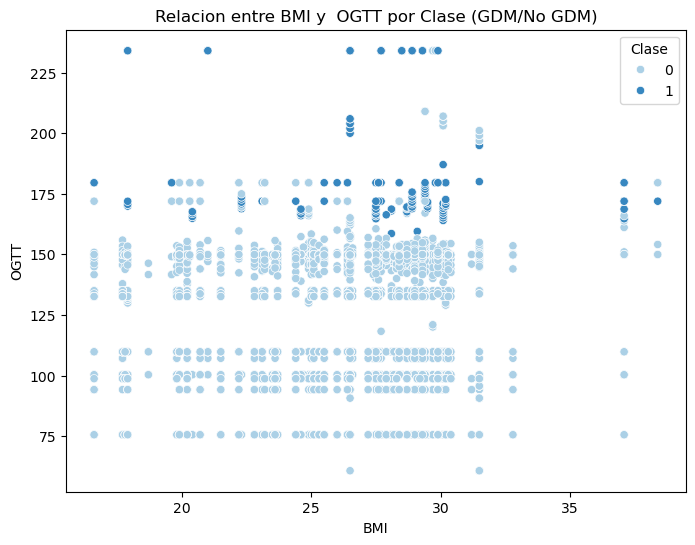

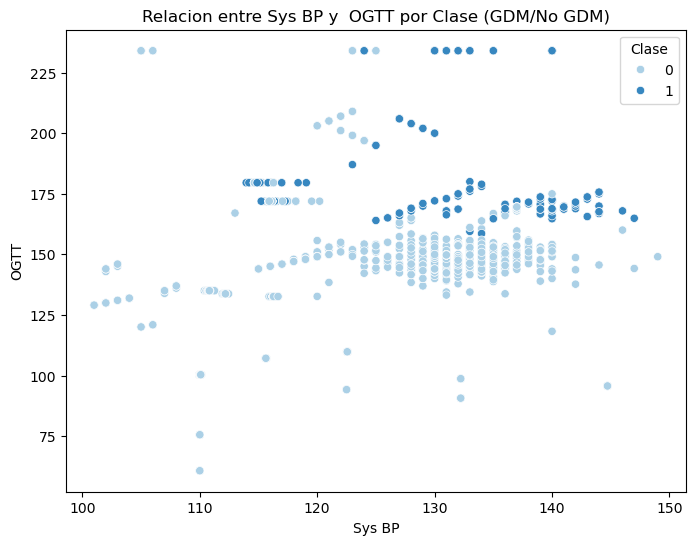

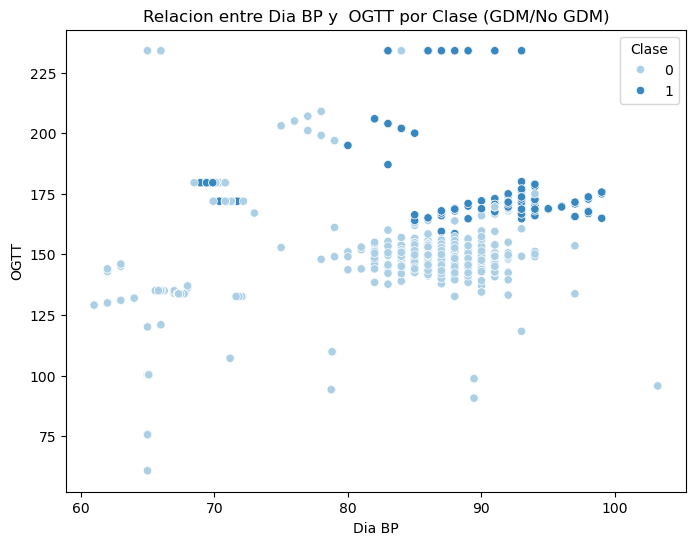

In [411]:
import matplotlib.pyplot as plt
import seaborn as sns

#Variables a mostrar
variables = ['BMI', 'Sys BP', 'Dia BP']
for var in variables:
    plt.figure(figsize=(8,6))
    sns.scatterplot(
        x=predictions_df[var],
        y=predictions_df['OGTT'],
        hue=predictions_df['Predicted Target'], 
        palette='Blues'
    )
    plt.title(f"Relacion entre {var} y  OGTT por Clase (GDM/No GDM)")
    plt.xlabel(var)
    plt.ylabel('OGTT')
    plt.legend(title='Clase')
    plt.show()
    

Conclusiones:
<ol>
    <li>OGTT y BMI:No parece haber una relación clara entre GDM y BMI, ya que ambas clases presentan un rango de BMI similar. </li>
    <li>OGTT y Systolic BP: No parece haber una tendencia clara entre Sys BP y OGTT para esta clase.</li>
    <li>OGTT y Diastolic BP: Los valores altos de Dia BP (>90 mmHg) están más asociados con la clase 1 (GDM), pero no hay una separación clara entre las clases.</li>
</ol>



## TAREA DE CLASIFICACIÓN GDM PARA DATASET DE CONSULTAS MÉDICAS

Vamos a remodelar las columnas a la entrada en el modelo para usar los mismos nombres y medidas que con los que se ha entrenado el modelo. 

In [57]:
encounterData.head()

,Unnamed: 0,user_id,UNITS,DATE,BIRTHDATE,GENDER,RACE,ETHNICITY,Age,HAS_DIABETES,...,BS,Glucose [Mass/volume] in Serum or Plasma,Glucose [Mass/volume] in Urine by Test strip,Glucose [Presence] in Urine by Test strip,HeartRate,SystolicBP,common_id,wearable_user_id,visit_number,Adjusted_DATE
0,17523,006a3718-02e0-4eee-deb2-27735709da2d,cm,2015-01-31 19:16:48+00:00,1982-11-13,F,white,nonhispanic,32,1,...,4.93395,91.1,0.9,0.0,93.0,90.0,user_140,user_0047,1,2024-06-23
1,17524,006a3718-02e0-4eee-deb2-27735709da2d,kg,2015-01-31 19:16:48+00:00,1982-11-13,F,white,nonhispanic,32,1,...,4.93395,91.1,0.9,0.0,93.0,90.0,user_140,user_0047,2,2024-06-23
2,17525,006a3718-02e0-4eee-deb2-27735709da2d,kg/m2,2015-01-31 19:16:48+00:00,1982-11-13,F,white,nonhispanic,32,1,...,4.93395,91.1,0.9,0.0,93.0,90.0,user_140,user_0047,3,2024-06-23
3,17526,006a3718-02e0-4eee-deb2-27735709da2d,mm[Hg],2015-01-31 19:16:48+00:00,1982-11-13,F,white,nonhispanic,32,1,...,4.93395,91.1,0.9,0.0,93.0,90.0,user_140,user_0047,4,2024-06-23
4,17527,006a3718-02e0-4eee-deb2-27735709da2d,mm[Hg],2015-01-31 19:16:48+00:00,1982-11-13,F,white,nonhispanic,32,1,...,4.93395,91.1,0.9,0.0,93.0,90.0,user_140,user_0047,5,2024-06-23


In [59]:
encounterData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8254 entries, 0 to 8253
Data columns (total 28 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Unnamed: 0                                          8254 non-null   int64  
 1   user_id                                             8254 non-null   object 
 2   UNITS                                               8254 non-null   object 
 3   DATE                                                8254 non-null   object 
 4   BIRTHDATE                                           8254 non-null   object 
 5   GENDER                                              8254 non-null   object 
 6   RACE                                                8254 non-null   object 
 7   ETHNICITY                                           8254 non-null   object 
 8   Age                                                 8254 non-null   int64  
 9

In [61]:
auxEncounterData = encounterData.copy()


In [63]:
auxEncounterData = auxEncounterData [['Age', 'Body mass index (BMI) [Ratio]', 'SystolicBP', 'DiastolicBP', 'BS']]

In [65]:
#Renombramos columnas
column_rename_mapping = {
    'BS': 'OGTT',
    'SystolicBP': 'Sys BP',
    'DiastolicBP': 'Dia BP', 
    'Body mass index (BMI) [Ratio]': 'BMI'
}
auxEncounterData  = auxEncounterData .rename(columns=column_rename_mapping)
print(auxEncounterData.columns)

Index(['Age', 'BMI', 'Sys BP', 'Dia BP', 'OGTT'], dtype='object')


In [67]:
# 1. Extraer las características comprimidas del encoder
encounter_encoded = encoder.predict(auxEncounterData)

# 2. Usar el Random Forest para hacer predicciones
predictionsEncounter= classifier.predict(encounter_encoded)

# 3. Mostrar las predicciones
print("Predicciones para los nuevos datos:")
print(predictionsEncounter)  # Esto devolverá las clases predichas (e.g., 0 = no GDM, 1 = GDM)

258/258 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step
Predicciones para los nuevos datos:
[1 1 1 ... 0 0 0]


In [69]:
# Crear un DataFrame con las predicciones
predictionsDfEncounter = auxEncounterData.copy()  # Copia los datos originales
predictionsDfEncounter['Predicted Target'] = predictionsEncounter  # Agregar las predicciones

# Mostrar las primeras filas
print(predictionsDfEncounter.head())

   Age   BMI  Sys BP  Dia BP     OGTT  Predicted Target
0   32  23.5    90.0    72.0  4.93395                 1
1   32  23.5    90.0    72.0  4.93395                 1
2   32  23.5    90.0    72.0  4.93395                 1
3   32  23.5    90.0    72.0  4.93395                 1
4   32  23.5    90.0    72.0  4.93395                 1


In [71]:
predictionsDfEncounter.to_csv('encounter-gdm-predictions.csv',index=False)

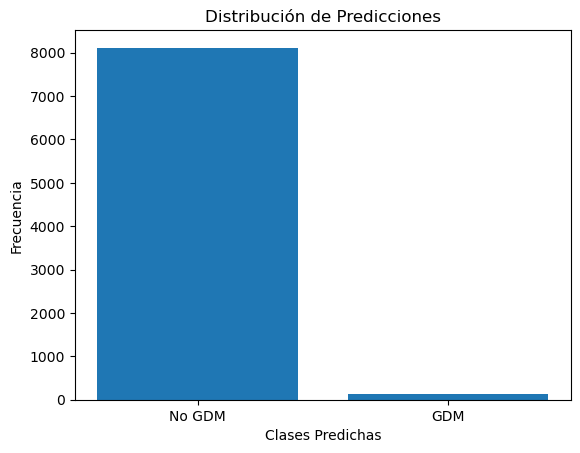

In [429]:
import matplotlib.pyplot as plt

# Conteo de predicciones
predCounts = predictionsDfEncounter['Predicted Target'].value_counts()

# Gráfico de barras
plt.bar(predCounts.index, predCounts.values, tick_label=['No GDM', 'GDM'])
plt.title('Distribución de Predicciones')
plt.xlabel('Clases Predichas')
plt.ylabel('Frecuencia')
plt.show()

Tenemos varias hipótesis de por qué no cuadran el número de personas clasificadas como GDM: 
<ol>
    <li>Sesgo en los datos generados: si los datos sintéticos del wearable fueron generados con menis casos de GDM o con patrones que no representan fielmente las características del GDM, el modelo puede estar subestimado la prevalencia. </li>
    <li>Distribución de clases desiquilibrada: si los datos de entrenamiento tenían fuerte desproporción entre las clases No GDM y GDM, el modelo podría estar sesgado hcia clasificarla mayoría de los casos como no GDM.</li>
    <li>Los datos del wearable pueden captar patrones temporales o fluctuaciones, como por ejemplo, variaciones en presión arterial, ritmo cardíaco u OGTT, que el algoritmo puede interpretar coo señales de GDM.</li>
    <li>Las decisiones en la consulta médica pueden basarse en medidas puntuaes y estandarizdas, como valotres OGTT, presión arterial y otros exámenes clínicos, lo cual puede subestimar cietos casos leves.</li>
</ol>

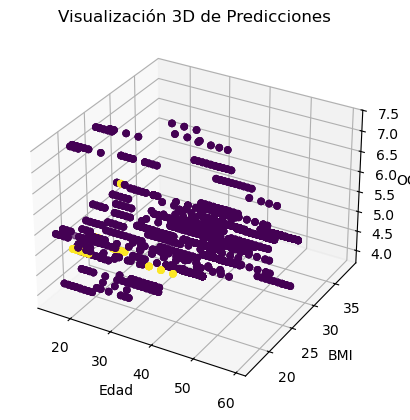

In [431]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Usar tres características principales para visualización
ax.scatter(predictionsDfEncounter['Age'], predictionsDfEncounter['BMI'], predictionsDfEncounter['OGTT'],
           c=predictionsDfEncounter['Predicted Target'], cmap='viridis', alpha=0.6)

ax.set_title('Visualización 3D de Predicciones')
ax.set_xlabel('Edad')
ax.set_ylabel('BMI')
ax.set_zlabel('OGTT')
plt.show()


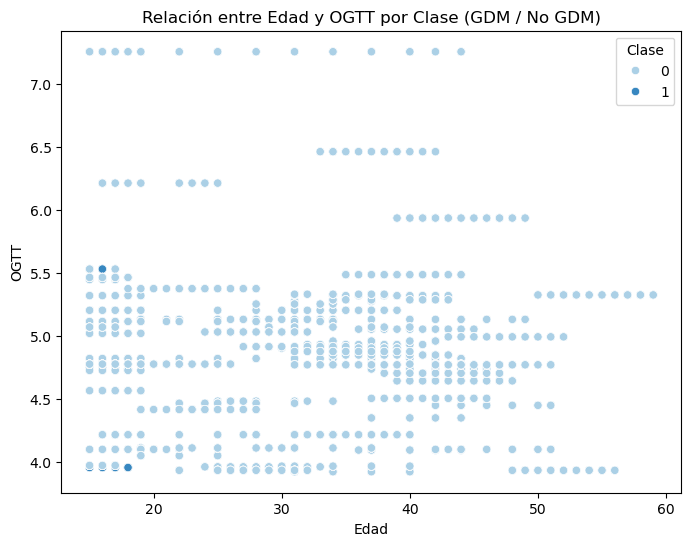

In [433]:
# Crear un gráfico de dispersión entre Edad y OGTT, coloreado por clase
plt.figure(figsize=(8, 6))
sns.scatterplot(x=predictionsDfEncounter['Age'], y=predictionsDfEncounter['OGTT'], hue=predictionsDfEncounter['Predicted Target'], palette='Blues')
plt.title('Relación entre Edad y OGTT por Clase (GDM / No GDM)')
plt.xlabel('Edad')
plt.ylabel('OGTT')
plt.legend(title='Clase')
plt.show()

In [437]:
from scipy.stats import mannwhitneyu

# Dividir las edades por clase
age_no_gdm = predictionsDfEncounter[predictionsDfEncounter['Predicted Target'] == 0]['Age']
age_gdm = predictionsDfEncounter[predictionsDfEncounter['Predicted Target'] == 1]['Age']

# Prueba de Mann-Whitney U (prueba no paramétrica)
stat, p = mannwhitneyu(age_no_gdm, age_gdm)
print(f"Estadístico U: {stat}, p-valor: {p}")

if p < 0.05:
    print("La diferencia en las edades entre las clases es estadísticamente significativa.")
else:
    print("No hay diferencia estadísticamente significativa en las edades entre las clases.")

Estadístico U: 1033732.5, p-valor: 2.1035705116927704e-65
La diferencia en las edades entre las clases es estadísticamente significativa.


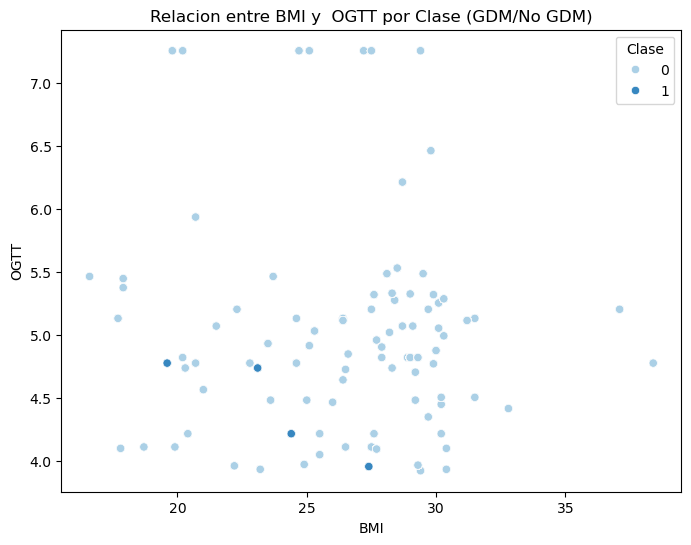

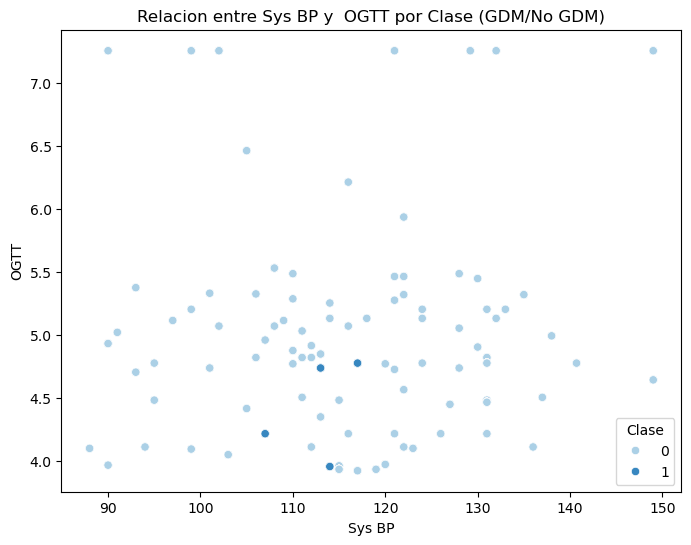

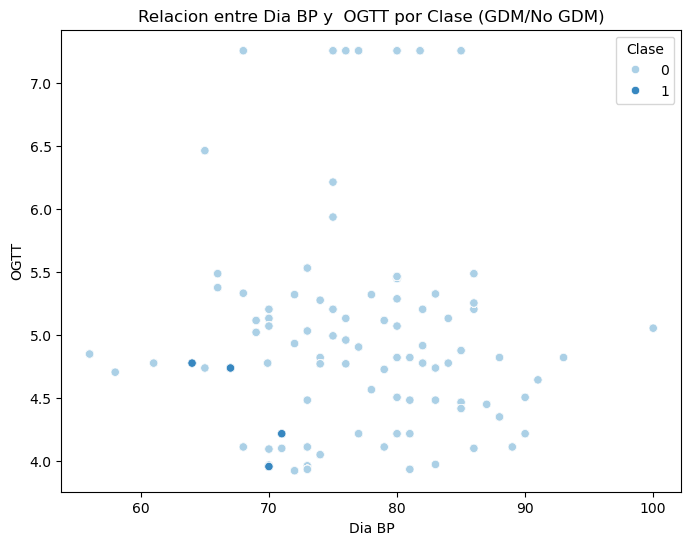

In [439]:
import matplotlib.pyplot as plt
import seaborn as sns

#Variables a mostrar
variables = ['BMI', 'Sys BP', 'Dia BP']
for var in variables:
    plt.figure(figsize=(8,6))
    sns.scatterplot(
        x=predictionsDfEncounter[var],
        y=predictionsDfEncounter['OGTT'],
        hue=predictionsDfEncounter['Predicted Target'], 
        palette='Blues'
    )
    plt.title(f"Relacion entre {var} y  OGTT por Clase (GDM/No GDM)")
    plt.xlabel(var)
    plt.ylabel('OGTT')
    plt.legend(title='Clase')
    plt.show()
    

No hay patrones claros para el dataset de consultas al médico, ya que hay pacientes que acuden con poca frecuencia, además hay una baja cantidad de puntos para la clase 1 GDM, que podría reflejar un desequilibrio en los datos. 


# PRUEBA DATOS SYNTHEA CONSULTA FILTRADOS SÓLO PARA MUJERES SANAS

In [127]:
healthyWomen = pd.read_csv('gdmEncounter.csv')

In [130]:
healthyWomen

,PATIENT,BMI,HDL,DBP,Glucose,Hemoglobin,SBP,PATIENT ID,AGE,HDHemoglobin
0,0037c68d-bbf3-0ce6-7fec-fa670bf7b996,28.1,58.00,86,87.60,15.0,130,958cbaed-4a32-40ff-f2ee-d55edc4f7611,20.0,16.4
1,006a3718-02e0-4eee-deb2-27735709da2d,23.5,61.50,72,70.00,13.0,90,d778d02c-1b71-582e-0c64-e9ce715996fc,19.0,13.0
2,01370617-7f62-f405-7b16-2cbc16b2e250,24.3,53.40,76,99.70,13.6,114,ff3708b4-748c-ae52-2430-bc60dd9fb5dd,32.0,13.6
3,0208384d-4316-4c11-0ffe-f0e13bca4417,28.2,55.80,76,93.40,11.8,135,6da671b7-6462-2ced-5b86-5b0fced4308b,49.0,11.8
4,0213db26-5738-14f0-4dc5-9e5be598241c,22.3,50.00,75,79.68,15.0,94,4551d27f-d5fc-2b84-1f53-74645d8ba7db,29.0,15.2
...,...,...,...,...,...,...,...,...,...,...
201,8fe2ae14-8ad6-2958-997c-56dc12079504,22.2,56.40,73,71.40,15.0,115,bbdaa7dc-6169-f296-701d-76f3d19fb981,25.0,17.1
202,907bbd26-5dd9-4ee1-6f31-2428ef3dbb2b,26.4,58.50,91,83.70,15.0,149,f242c481-8b94-4e94-6fb8-7930fb8aed4a,18.0,15.7
203,90b58ecf-cf31-149f-9a9d-38a98547a950,18.5,52.32,87,77.06,12.4,134,faa32210-cefe-9df6-bac3-ba195e4d7247,46.0,12.4
204,90c661b9-0989-5322-fba7-a59d9a0dda5f,24.5,50.00,79,87.00,12.1,96,3a4f7ecf-c03d-6d9d-af23-8ad9de7b7ca2,21.0,12.1


In [161]:
cols_to_drop = ['HDHemoglobin', 'PATIENT']
healthyWomen.drop(columns=cols_to_drop, inplace = True)

In [163]:
healthyWomen.columns

Index(['BMI', 'HDL', 'DBP', 'Glucose', 'Hemoglobin', 'SBP', 'PATIENT ID',
       'AGE'],
      dtype='object')

In [173]:
#Renombramos columnas a nombre de dataset de entrenamiento
column_mapping = {
    'AGE':'Age', 
    'Glucose': 'OGTT', 
    'DBP': 'Dia BP', 
    'SBP': 'Sys BP'
}

healthyWomen.rename(columns=column_mapping, inplace=True)

In [175]:
healthyWomen.columns

Index(['BMI', 'HDL', 'Dia BP', 'OGTT', 'Hemoglobin', 'Sys BP', 'PATIENT ID',
       'Age'],
      dtype='object')

# PREDICCIONES

In [180]:
selected_features = ['Age', 'BMI', 'Sys BP', 'Dia BP', 'OGTT', 'HDL', 'Hemoglobin']
X_new = healthyWomen[selected_features]

X_new_encoded = encoder.predict(X_new) #extracción características con autoencoder
y_pred = classifier.predict(X_new_encoded) #predicciones con RF
healthyWomen['Risk prediction'] = y_pred 

y_pred_prob = classifier.predict_proba(X_new_encoded) #probabilidades de prediccion
print("Probabilidades de predicción:", y_pred_prob)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Probabilidades de predicción: [[9.98783489e-01 1.21651148e-03]
 [1.00000000e+00 0.00000000e+00]
 [1.00000000e+00 0.00000000e+00]
 [9.99422930e-01 5.77070391e-04]
 [9.96356013e-01 3.64398651e-03]
 [9.98600779e-01 1.39922114e-03]
 [1.00000000e+00 0.00000000e+00]
 [9.99608788e-01 3.91212069e-04]
 [9.98595720e-01 1.40428033e-03]
 [1.00000000e+00 0.00000000e+00]
 [9.98929011e-01 1.07098935e-03]
 [9.99608788e-01 3.91212069e-04]
 [9.97389553e-01 2.61044698e-03]
 [1.00000000e+00 0.00000000e+00]
 [1.00000000e+00 0.00000000e+00]
 [9.94088834e-01 5.91116584e-03]
 [8.13461023e-01 1.86538977e-01]
 [7.54645828e-01 2.45354172e-01]
 [1.00000000e+00 0.00000000e+00]
 [9.99773753e-01 2.26247346e-04]
 [9.99623246e-01 3.76753950e-04]
 [9.99163534e-01 8.36466376e-04]
 [9.99623246e-01 3.76753950e-04]
 [9.95399934e-01 4.60006554e-03]
 [9.97054515e-01 2.94548532e-03]
 [6.67643141e-01 3.32356859e-01]
 [9.98551786e-01 1.44821356e-03]
 [9.96320545e-01 3.67945535e-03]
 [1.0000

In [182]:
healthyWomen.to_csv('gdmEncounter_PREDICTIONS.csv', index=False)

In [184]:
healthyWomen

,BMI,HDL,Dia BP,OGTT,Hemoglobin,Sys BP,PATIENT ID,Age,Risk prediction
0,28.1,58.00,86,87.60,15.0,130,958cbaed-4a32-40ff-f2ee-d55edc4f7611,20.0,0
1,23.5,61.50,72,70.00,13.0,90,d778d02c-1b71-582e-0c64-e9ce715996fc,19.0,0
2,24.3,53.40,76,99.70,13.6,114,ff3708b4-748c-ae52-2430-bc60dd9fb5dd,32.0,0
3,28.2,55.80,76,93.40,11.8,135,6da671b7-6462-2ced-5b86-5b0fced4308b,49.0,0
4,22.3,50.00,75,79.68,15.0,94,4551d27f-d5fc-2b84-1f53-74645d8ba7db,29.0,0
...,...,...,...,...,...,...,...,...,...
201,22.2,56.40,73,71.40,15.0,115,bbdaa7dc-6169-f296-701d-76f3d19fb981,25.0,0
202,26.4,58.50,91,83.70,15.0,149,f242c481-8b94-4e94-6fb8-7930fb8aed4a,18.0,0
203,18.5,52.32,87,77.06,12.4,134,faa32210-cefe-9df6-bac3-ba195e4d7247,46.0,0
204,24.5,50.00,79,87.00,12.1,96,3a4f7ecf-c03d-6d9d-af23-8ad9de7b7ca2,21.0,0


## EXTRACCIÓN DE LA IMPORTANCIA DE LAS CARACTERÍSTICAS

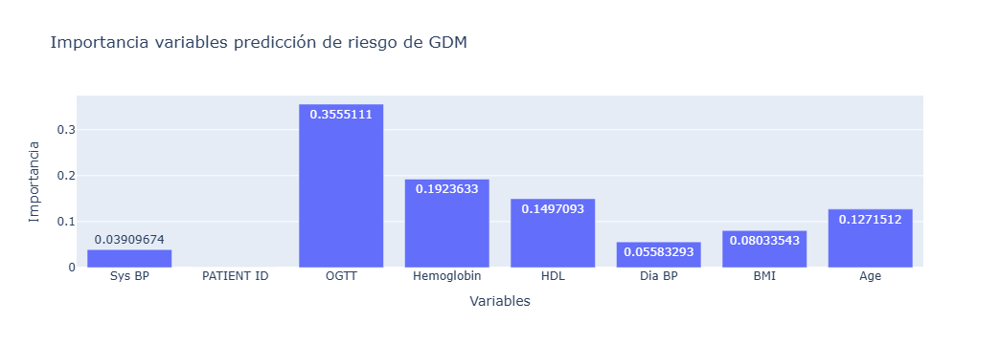

In [193]:
import plotly.express as px
import plotly.graph_objects as go

if healthyWomen['Risk prediction'].dtype != 'O':
    healthyWomen['Risk prediction'] = healthyWomen['Risk prediction'].map({0:'No GDM Risk', 1:'GDM Risk'})

#importancia características RF
feature_importance = classifier.feature_importances_
features = list(healthyWomen.columns[:-1]) #todas las columnas salvo predicciones

sorted_indices = np.argsort(features)[::-1]
sorted_features = [features[i] for i in sorted_indices]
sorted_importance = feature_importance[sorted_indices]

fig_importance = px.bar(
    x= sorted_features, 
    y=sorted_importance, 
    labels={'x':'Variables', 'y':'Importancia'}, 
    title="Importancia variables predicción de riesgo de GDM", 
    text_auto=True
)

fig_importance.show()

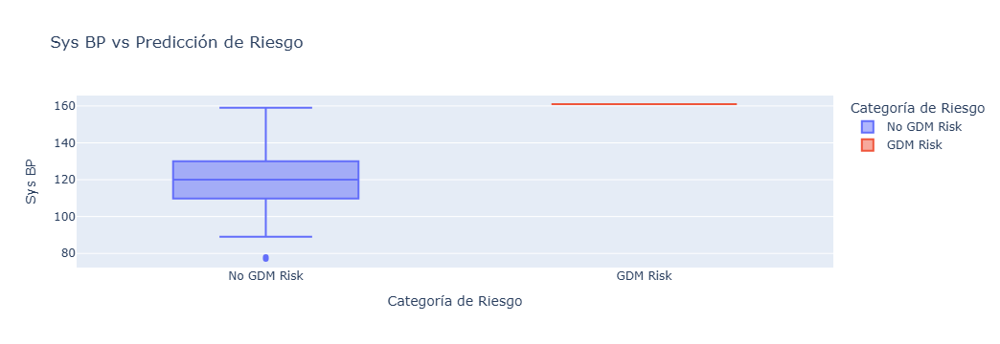

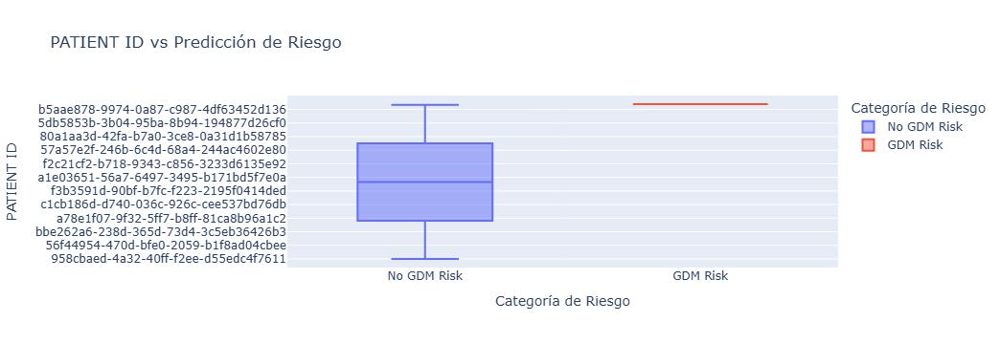

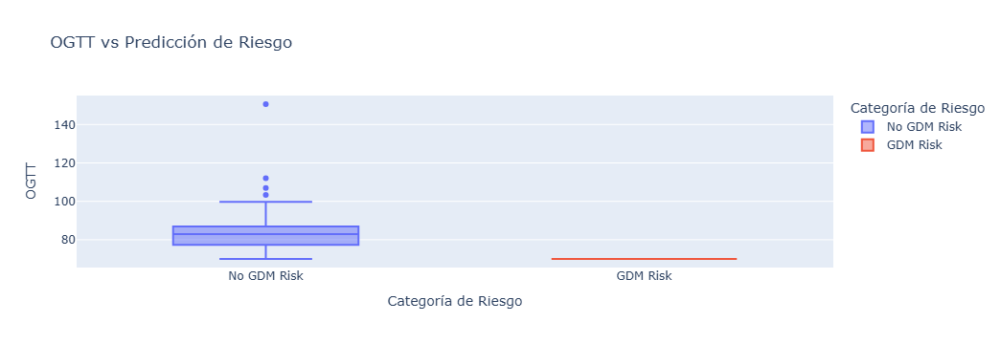

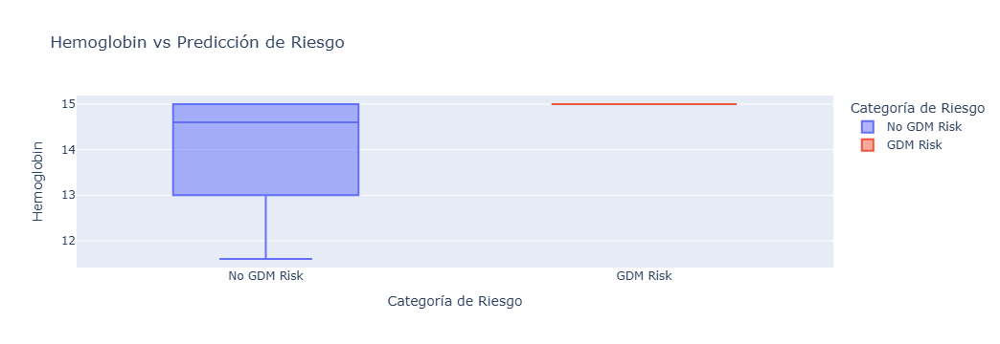

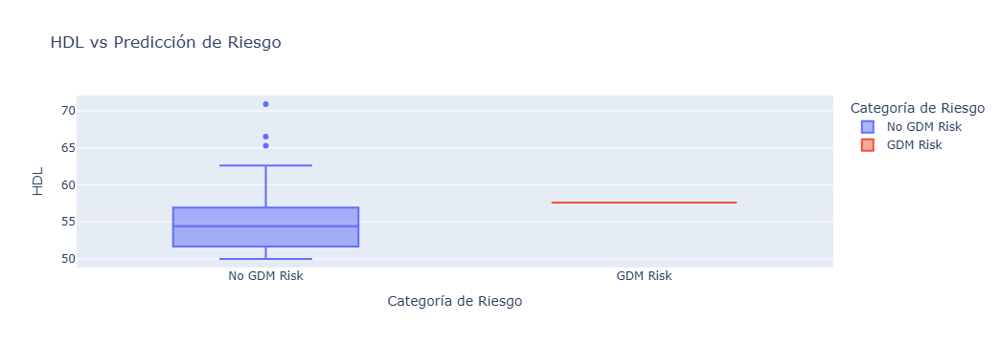

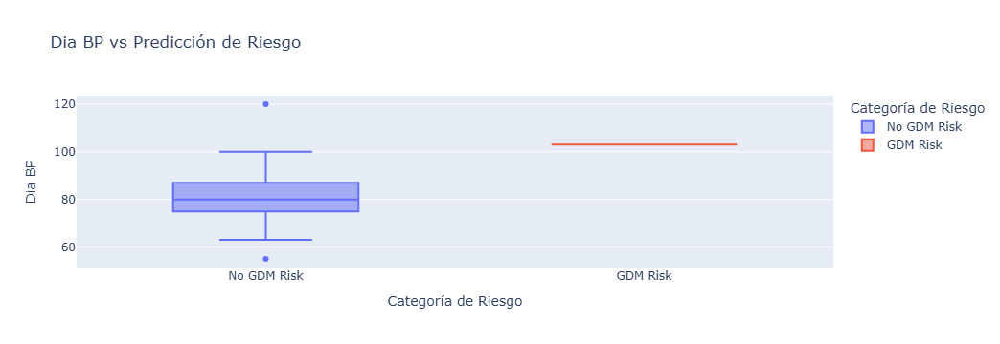

In [195]:
fig_boxplots = []
for feature in sorted_features[:6]:
    fig = px.box(
        healthyWomen, 
        x="Risk prediction", 
        y = feature,
        title = f"{feature} vs Predicción de Riesgo", 
        labels = {'Risk prediction': 'Categoría de Riesgo'},
        color = "Risk prediction"
    )
    fig_boxplots.append(fig)
for fig in fig_boxplots:
    fig.show()

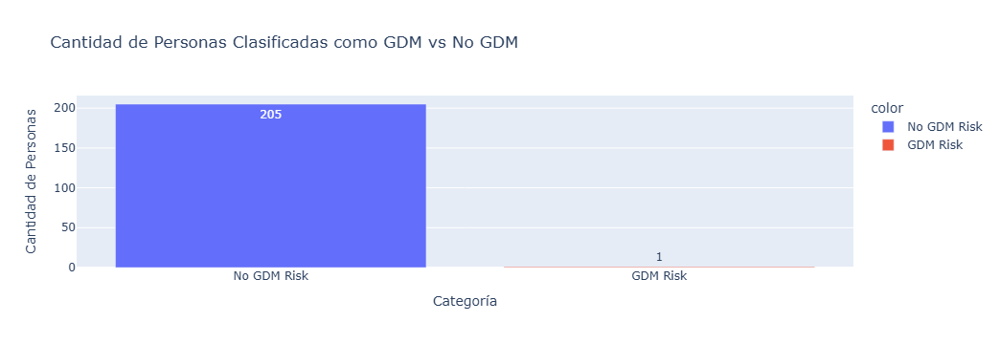

In [199]:
import plotly.express as px

# Contar la cantidad de personas en cada categoría de "Risk prediction"
gdm_counts = healthyWomen["Risk prediction"].value_counts()

# Crear gráfico de barras con Plotly
fig_gdm = px.bar(
    x=gdm_counts.index,
    y=gdm_counts.values,
    labels={'x': 'Categoría', 'y': 'Cantidad de Personas'},
    title="Cantidad de Personas Clasificadas como GDM vs No GDM",
    text_auto=True,
    color=gdm_counts.index
)

# Mostrar gráfico
fig_gdm.show()

El resultado es de esperar, ya que en se ha seleccionado UNICAMENTE las pacientes con un embarazo SANO. Así que podemos decir que el modelo lo clasifica bien 

# PRUEBA CON CASOS DE DIABETES

In [56]:
diabeticPatients = pd.read_csv('gdmEncounterDiabeticPatients.csv')

In [58]:
diabeticPatients

,PATIENT,BMI,HDL,DBP,Glucose,Hemoglobin,SBP,PATIENT ID,Age
0,0037c68d-bbf3-0ce6-7fec-fa670bf7b996,28.1,58.0,86.0,87.60,15.0,130,958cbaed-4a32-40ff-f2ee-d55edc4f7611,20
1,006a3718-02e0-4eee-deb2-27735709da2d,23.5,61.5,72.0,70.00,13.0,90,958cbaed-4a32-40ff-f2ee-d55edc4f7611,20
2,01370617-7f62-f405-7b16-2cbc16b2e250,24.3,53.4,76.0,99.70,13.6,114,d778d02c-1b71-582e-0c64-e9ce715996fc,19
3,0208384d-4316-4c11-0ffe-f0e13bca4417,28.2,55.8,76.0,93.40,11.8,135,d778d02c-1b71-582e-0c64-e9ce715996fc,19
4,0213db26-5738-14f0-4dc5-9e5be598241c,22.3,45.4,75.0,76.62,15.0,94,958cbaed-4a32-40ff-f2ee-d55edc4f7611,20
...,...,...,...,...,...,...,...,...,...
359,fdcc36b7-0bfd-276d-52dd-4059230ff7ca,25.4,51.6,81.8,74.94,12.9,102,4551d27f-d5fc-2b84-1f53-74645d8ba7db,29
360,fe026ae0-a34c-5399-b6d1-129d573de9f7,27.3,53.8,81.4,88.50,15.0,104,4551d27f-d5fc-2b84-1f53-74645d8ba7db,29
361,fe431a7e-d7fc-03da-38c9-305889835377,29.9,55.4,81.2,87.00,15.0,132,4551d27f-d5fc-2b84-1f53-74645d8ba7db,29
362,ff3708b4-748c-ae52-2430-bc60dd9fb5dd,25.3,62.6,78.6,77.50,12.5,111,4551d27f-d5fc-2b84-1f53-74645d8ba7db,29


In [60]:
cols_to_drop = ['PATIENT', 'PATIENT ID']
diabeticPatients.drop(columns=cols_to_drop, inplace = True)

In [62]:
diabeticPatients.columns

Index(['BMI', 'HDL', 'DBP', 'Glucose', 'Hemoglobin', 'SBP', 'Age'], dtype='object')

In [64]:
#Renombramos columnas a nombre de dataset de entrenamiento
column_mapping = {
    'AGE':'Age', 
    'Glucose': 'OGTT', 
    'DBP': 'Dia BP', 
    'SBP': 'Sys BP'
}

diabeticPatients.rename(columns=column_mapping, inplace=True)

## PREDICCIONES 

In [69]:
selected_features = ['Age', 'BMI', 'Sys BP', 'Dia BP', 'OGTT', 'HDL']
X_new = diabeticPatients[selected_features]

X_new_encoded = encoder.predict(X_new) #extracción características con autoencoder
y_pred = classifier.predict(X_new_encoded) #predicciones con RF
diabeticPatients['Risk prediction'] = y_pred 

y_pred_prob = classifier.predict_proba(X_new_encoded) #probabilidades de prediccion
print("Probabilidades de predicción:", y_pred_prob)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Probabilidades de predicción: [[9.75026107e-01 2.49738927e-02]
 [1.00000000e+00 0.00000000e+00]
 [1.00000000e+00 0.00000000e+00]
 [9.78625750e-01 2.13742505e-02]
 [1.00000000e+00 0.00000000e+00]
 [1.00000000e+00 0.00000000e+00]
 [1.00000000e+00 0.00000000e+00]
 [1.00000000e+00 0.00000000e+00]
 [9.99418436e-01 5.81563912e-04]
 [9.76269142e-01 2.37308577e-02]
 [1.00000000e+00 0.00000000e+00]
 [1.00000000e+00 0.00000000e+00]
 [1.00000000e+00 0.00000000e+00]
 [1.00000000e+00 0.00000000e+00]
 [9.98597864e-01 1.40213647e-03]
 [1.00000000e+00 0.00000000e+00]
 [9.60688958e-01 3.93110423e-02]
 [8.72402532e-01 1.27597468e-01]
 [1.00000000e+00 0.00000000e+00]
 [9.99709218e-01 2.90781956e-04]
 [9.72847881e-01 2.71521190e-02]
 [9.79580660e-01 2.04193396e-02]
 [9.72847881e-01 2.71521190e-02]
 [1.00000000e+00 0.00000000e+00]
 [1.00000000e+00 0.00000000e+00]
 [8.91535745e-01 1.08464255e-01]
 [9.72067203e-01 2.79327966e-02]
 [1.00000000e+00 0.00000000e+00]
 [1.00

In [71]:
diabeticPatients.to_csv('gdmEncounterDiabeticPatients_PREDICTIONS.csv', index=False)

In [73]:
diabeticPatients

,BMI,HDL,Dia BP,OGTT,Hemoglobin,Sys BP,Age,Risk prediction
0,28.1,58.0,86.0,87.60,15.0,130,20,0
1,23.5,61.5,72.0,70.00,13.0,90,20,0
2,24.3,53.4,76.0,99.70,13.6,114,19,0
3,28.2,55.8,76.0,93.40,11.8,135,19,0
4,22.3,45.4,75.0,76.62,15.0,94,20,0
...,...,...,...,...,...,...,...,...
359,25.4,51.6,81.8,74.94,12.9,102,29,0
360,27.3,53.8,81.4,88.50,15.0,104,29,0
361,29.9,55.4,81.2,87.00,15.0,132,29,0
362,25.3,62.6,78.6,77.50,12.5,111,29,0


## EXTRACCIÓN DE IMPORTANCIA DE LAS CARACTERÍSTICAS

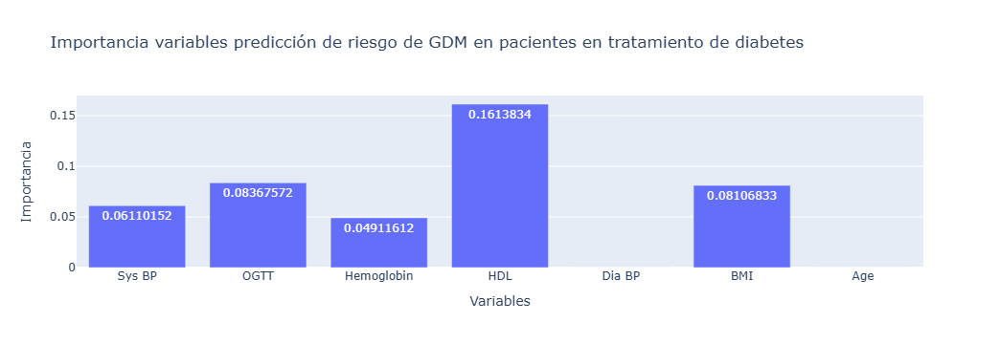

In [76]:
import plotly.express as px
import plotly.graph_objects as go

if diabeticPatients['Risk prediction'].dtype != 'O':
    diabeticPatients['Risk prediction'] = diabeticPatients['Risk prediction'].map({0:'No GDM Risk', 1:'GDM Risk'})

#importancia características RF
feature_importance = classifier.feature_importances_
features = list(diabeticPatients.columns[:-1]) #todas las columnas salvo predicciones

sorted_indices = np.argsort(features)[::-1]
sorted_features = [features[i] for i in sorted_indices]
sorted_importance = feature_importance[sorted_indices]

fig_importance = px.bar(
    x= sorted_features, 
    y=sorted_importance, 
    labels={'x':'Variables', 'y':'Importancia'}, 
    title="Importancia variables predicción de riesgo de GDM en pacientes en tratamiento de diabetes", 
    text_auto=True
)

fig_importance.show()

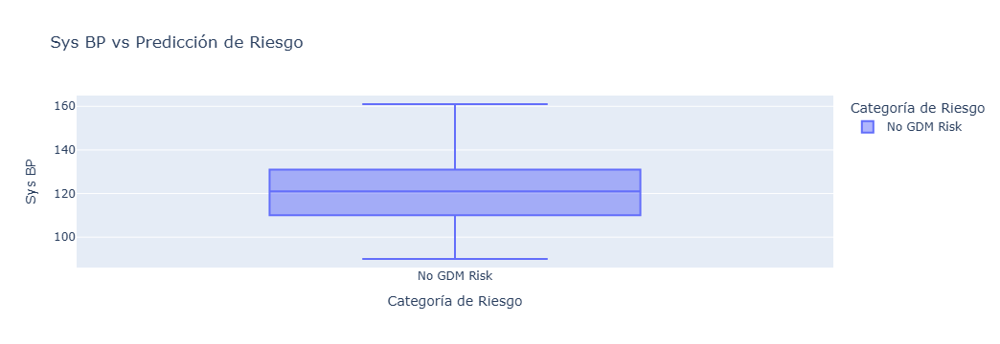

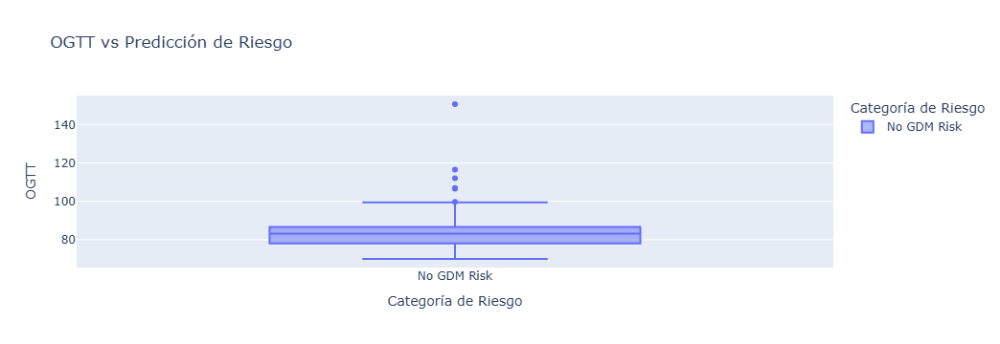

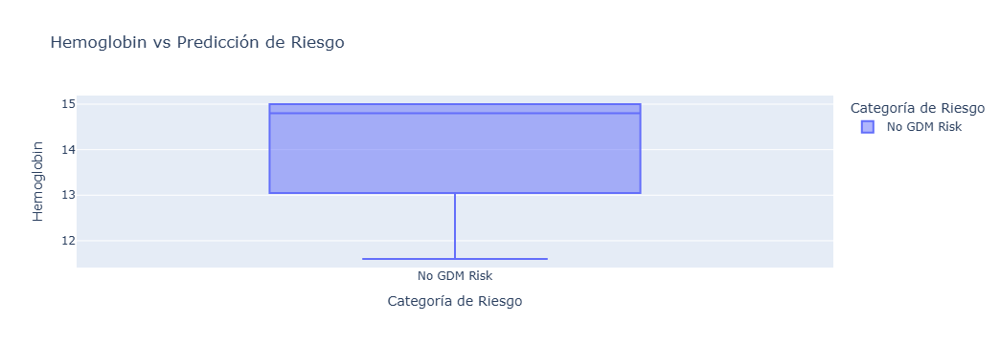

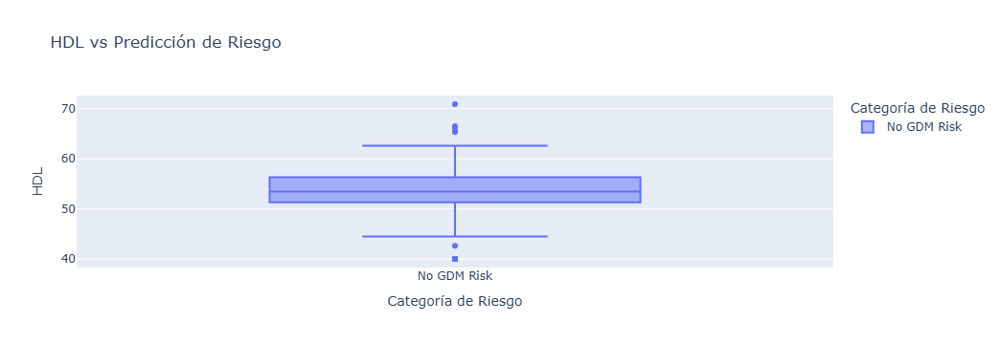

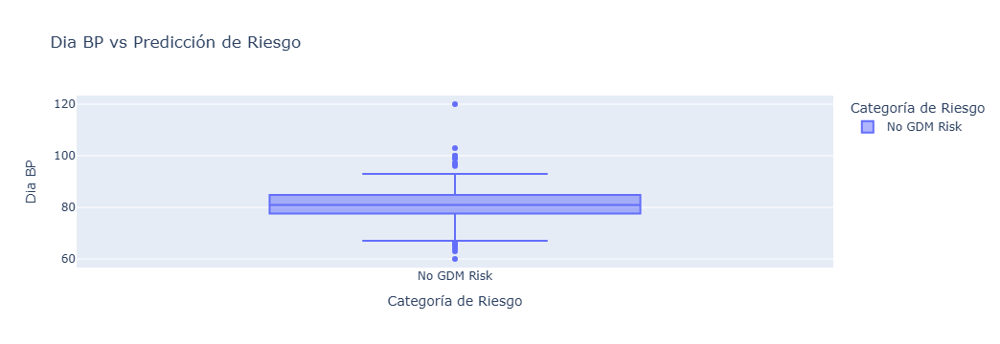

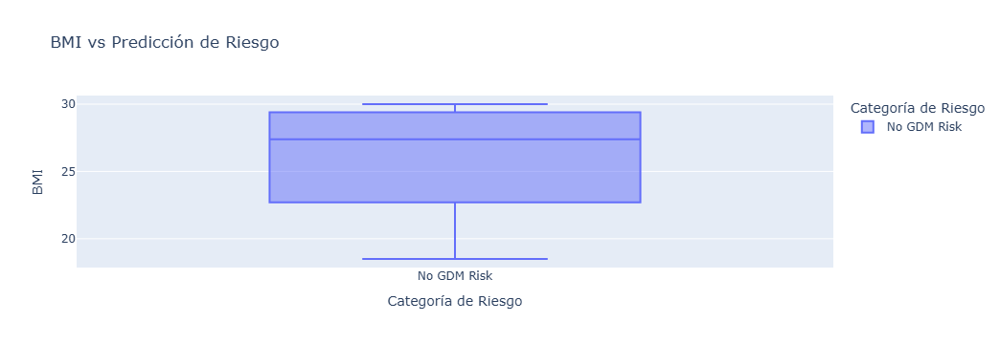

In [78]:
fig_boxplots = []
for feature in sorted_features[:6]:
    fig = px.box(
        diabeticPatients, 
        x="Risk prediction", 
        y = feature,
        title = f"{feature} vs Predicción de Riesgo", 
        labels = {'Risk prediction': 'Categoría de Riesgo'},
        color = "Risk prediction"
    )
    fig_boxplots.append(fig)
for fig in fig_boxplots:
    fig.show()

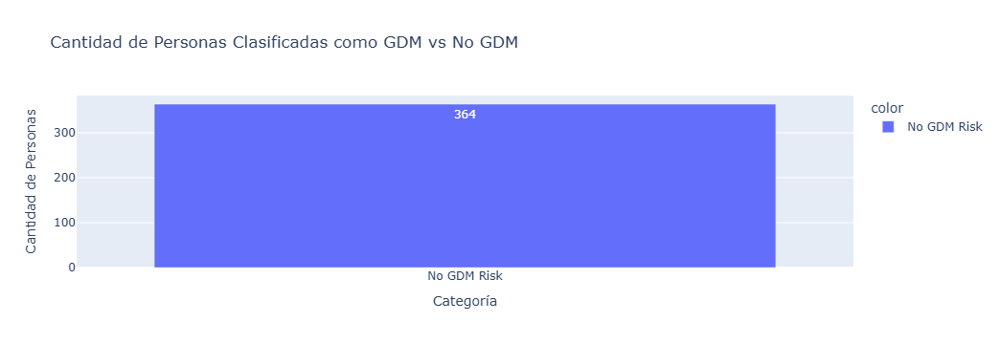

In [82]:
import plotly.express as px

# Contar la cantidad de personas en cada categoría de "Risk prediction"
gdm_counts_diabetic = diabeticPatients["Risk prediction"].value_counts()

# Crear gráfico de barras con Plotly
fig_gdm = px.bar(
    x=gdm_counts_diabetic.index,
    y=gdm_counts_diabetic.values,
    labels={'x': 'Categoría', 'y': 'Cantidad de Personas'},
    title="Cantidad de Personas Clasificadas como GDM vs No GDM",
    text_auto=True,
    color=gdm_counts_diabetic.index
)

# Mostrar gráfico
fig_gdm.show()

Como podemos observar, pese a que hemos filtrado para las mujeres que se encuentran en tratamiento para manjear la diabetes, los niveles de glucosa son normales, al final se trata de datos sintéticos obtenidos por un software ipen -source que genera pacientes hipotéticos, por lo que sería óptimo usar la inteligencia artificial para crear un dataset con valores típicos de diabetes gestacional. 

# PRUEBA DE DATOS CREADOS CON INTELIGENCIA ARTIFICIAL 

In [106]:
syn_diabetes = pd.read_csv('gdm_extreme_data.csv')

In [108]:
syn_diabetes

,PATIENT,BMI,HDL,DBP,Glucose,Hemoglobin,SBP,PATIENT ID,Age
0,0037c68d-bbf3-0ce6-7fec-fa670bf7b996,24.895497,77.493219,105.770556,208.091171,12.714440,186.126512,958cbaed-4a32-40ff-f2ee-d55edc4f7611,20
1,006a3718-02e0-4eee-deb2-27735709da2d,25.609046,71.761515,97.584236,218.541202,14.725304,197.532193,958cbaed-4a32-40ff-f2ee-d55edc4f7611,20
2,01370617-7f62-f405-7b16-2cbc16b2e250,26.166448,69.338054,104.371693,185.868913,13.404207,194.848179,d778d02c-1b71-582e-0c64-e9ce715996fc,19
3,0208384d-4316-4c11-0ffe-f0e13bca4417,26.450733,76.664931,98.663954,205.174076,13.398898,190.642591,d778d02c-1b71-582e-0c64-e9ce715996fc,19
4,0213db26-5738-14f0-4dc5-9e5be598241c,28.078183,71.220706,115.397645,208.643438,14.281727,191.537894,958cbaed-4a32-40ff-f2ee-d55edc4f7611,20
...,...,...,...,...,...,...,...,...,...
359,fdcc36b7-0bfd-276d-52dd-4059230ff7ca,27.140408,71.778088,101.427008,176.439066,12.484102,184.544165,4551d27f-d5fc-2b84-1f53-74645d8ba7db,29
360,fe026ae0-a34c-5399-b6d1-129d573de9f7,25.360636,78.731834,103.300769,207.831521,13.715988,163.544189,4551d27f-d5fc-2b84-1f53-74645d8ba7db,29
361,fe431a7e-d7fc-03da-38c9-305889835377,27.999132,64.640946,103.294620,199.568890,14.416297,179.505112,4551d27f-d5fc-2b84-1f53-74645d8ba7db,29
362,ff3708b4-748c-ae52-2430-bc60dd9fb5dd,24.480634,68.663375,101.530000,212.789179,14.280483,163.105973,4551d27f-d5fc-2b84-1f53-74645d8ba7db,29


In [110]:
cols_to_drop = ['PATIENT', 'PATIENT ID']
syn_diabetes.drop(columns=cols_to_drop, inplace = True)

In [112]:
#Renombramos columnas a nombre de dataset de entrenamiento
column_mapping = {
    'Glucose': 'OGTT', 
    'DBP': 'Dia BP', 
    'SBP': 'Sys BP'
}

syn_diabetes.rename(columns=column_mapping, inplace=True)

In [114]:
selected_features = ['Age', 'BMI', 'Sys BP', 'Dia BP', 'OGTT', 'HDL']
X_new = syn_diabetes[selected_features]

X_new_encoded = encoder.predict(X_new) #extracción características con autoencoder
y_pred = classifier.predict(X_new_encoded) #predicciones con RF
syn_diabetes['Risk prediction'] = y_pred 

y_pred_prob = classifier.predict_proba(X_new_encoded) #probabilidades de prediccion
print("Probabilidades de predicción:", y_pred_prob)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Probabilidades de predicción: [[0.48403261 0.51596739]
 [0.50810789 0.49189211]
 [0.56814229 0.43185771]
 [0.56209757 0.43790243]
 [0.44718482 0.55281518]
 [0.4330596  0.5669404 ]
 [0.69168588 0.30831412]
 [0.42668259 0.57331741]
 [0.49805152 0.50194848]
 [0.54266459 0.45733541]
 [0.71009223 0.28990777]
 [0.61741553 0.38258447]
 [0.49104749 0.50895251]
 [0.45875509 0.54124491]
 [0.63452579 0.36547421]
 [0.55598017 0.44401983]
 [0.45641968 0.54358032]
 [0.71467584 0.28532416]
 [0.60353561 0.39646439]
 [0.68039746 0.31960254]
 [0.45525883 0.54474117]
 [0.42381533 0.57618467]
 [0.5400398  0.4599602 ]
 [0.46103347 0.53896653]
 [0.53892988 0.46107012]
 [0.44532419 0.55467581]
 [0.4902563  0.5097437 ]
 [0.46276088 0.53723912]
 [0.44816668 0.55183332]
 [0.46187674 0.53812326]
 [0.65004904 0.34995096]
 [0.46284152 0.53715848]
 [0.50642783 0.49357217]
 [0.45569752 0.54430248]
 [0.45578745 0.54421255]
 [0.58379008 0.41620992]
 [0.50427997 0.49572003]
 [0.4

In [116]:
syn_diabetes.to_csv('gdmEncounterSynthetic_DiabeticPatients_PREDICTIONS.csv', index=False)

In [118]:
syn_diabetes

,BMI,HDL,Dia BP,OGTT,Hemoglobin,Sys BP,Age,Risk prediction
0,24.895497,77.493219,105.770556,208.091171,12.714440,186.126512,20,1
1,25.609046,71.761515,97.584236,218.541202,14.725304,197.532193,20,0
2,26.166448,69.338054,104.371693,185.868913,13.404207,194.848179,19,0
3,26.450733,76.664931,98.663954,205.174076,13.398898,190.642591,19,0
4,28.078183,71.220706,115.397645,208.643438,14.281727,191.537894,20,1
...,...,...,...,...,...,...,...,...
359,27.140408,71.778088,101.427008,176.439066,12.484102,184.544165,29,0
360,25.360636,78.731834,103.300769,207.831521,13.715988,163.544189,29,0
361,27.999132,64.640946,103.294620,199.568890,14.416297,179.505112,29,0
362,24.480634,68.663375,101.530000,212.789179,14.280483,163.105973,29,0


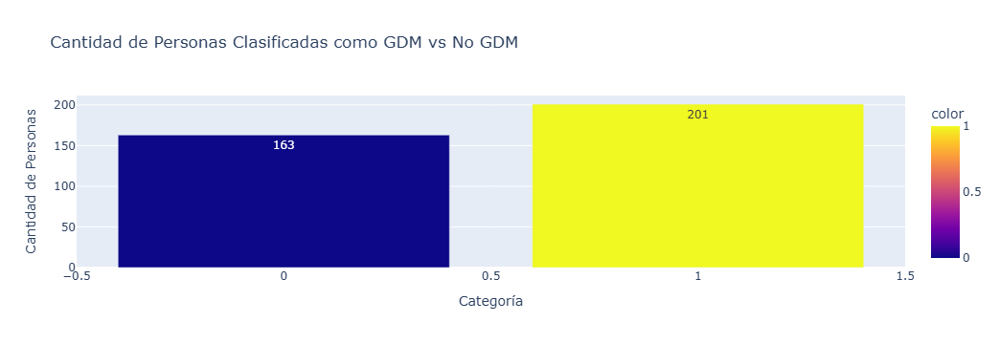

In [120]:
import plotly.express as px

# Contar la cantidad de personas en cada categoría de "Risk prediction"
gdm_counts_diabetic = syn_diabetes["Risk prediction"].value_counts()

# Crear gráfico de barras con Plotly
fig_gdm = px.bar(
    x=gdm_counts_diabetic.index,
    y=gdm_counts_diabetic.values,
    labels={'x': 'Categoría', 'y': 'Cantidad de Personas'},
    title="Cantidad de Personas Clasificadas como GDM vs No GDM",
    text_auto=True,
    color=gdm_counts_diabetic.index
)

# Mostrar gráfico
fig_gdm.show()

Podemos observar que, pese a que todas las pacientes creadas tienen diabetes, el modelo no reconocce a todas las pacientes.

Algunas hipótesis son:
<ol>
    <li>Los datos de prueba contienen valores dentro del rango normal: aunque hemos generado datos extremos, la aleatoriedad en la asignación de valores por parte de la IA puede hacer que algunas muestras tengan características similares a personas sin diabetes.</li>
    <li>El autoencoder puede estar suavizando las diferencias: este reduce la dimensionalidad y puede comprirmir demasiado la infromación, eliminando la diferenciació entre casos graves y normales. Una solución sería reducir la compresión (<code>encoding_dim=20 o más</code>) y probar sin autoencoder.</li>
    <li>El umbral de clasificación en RF está por defecto en 0.5: el algoritmo usa probabilidad yy por defecto clasifica como "1" si la probailidad es mayor a 0.5, si algunos casos extremos tienen una probabilidad del 0.49 los clasifica como No GDM. Una solución sería ajustar eel umbral de decisión. </li>
    <li>Hay características incluidas en las predicciones que no contribuyen significativamente a la predicción, el modelo puede ignorarlas. </li>
</ol>